<center> <font size="6"> <div class="alert alert-block alert-success"> <strong> Project The Smith Parasite - Machine Learning </strong> </div> </font> </center>

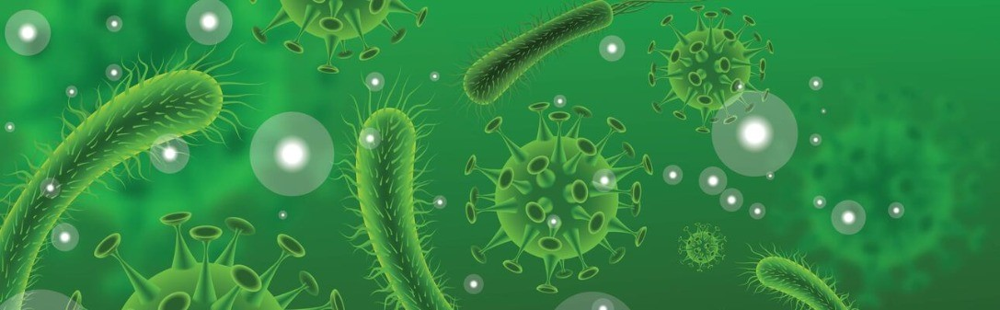

 
 
 
 <center> <font size="6"> Group 37 </font> </center>

|      |     Student Name     |     Student ID     | 
|---   |         ---          |           ---          |
| 1    |      Carolina Mira        |       20220553         | 
| 2    |      Catarina Alves        |       20220680         |
| 3    |      João Ferreira        |       r20191233         |
| 4    |      Margarida Pereira        |       r20191195         | 
| 5    |      Rita Silva        |       20220544         | 


# Imports #

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import os
import statsmodels.api as sm
from statsmodels.formula.api import ols
from math import ceil
import warnings
warnings.filterwarnings('ignore')

#!pip install bioinfokit
from bioinfokit.analys import stat

#For Pandas Profiling
#!pip install pandas-profiling
from pandas_profiling import ProfileReport

#!pip install jupyter_contrib_nbextensions
#!jupyter nbextension enable --py widgetsnbextension

#!pip install researchpy
import researchpy

import sklearn
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import f1_score, classification_report
from sklearn.feature_selection import SelectKBest, chi2, f_regression, RFE, SelectFromModel
from sklearn.neighbors import KNeighborsClassifier
from sklearn.impute import KNNImputer
import statsmodels.api as sm
from statsmodels.formula.api import ols
from matplotlib import pyplot
from numpy import array
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier, Lasso
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn import svm
from sklearn.decomposition import PCA

# Data Loading #

## Read df 

* Sociodemographic Data

In [2]:
train_demo = pd.read_excel('train_demo.xlsx')
test_demo = pd.read_excel('test_demo.xlsx')

* Health Related Data

In [3]:
train_health = pd.read_excel('train_health.xlsx')
test_health = pd.read_excel('test_health.xlsx')

* Habits related Data

In [4]:
train_habits = pd.read_excel('train_habits.xlsx')
test_habits = pd.read_excel('test_habits.xlsx')

## Merge df ##

In [5]:
#merge train_demo, train_health and train_habits
train = train_demo.merge(train_health,on='PatientID').merge(train_habits,on='PatientID')

In [6]:
test = test_demo.merge(test_health,on='PatientID').merge(test_habits,on='PatientID')

## Create Auxiliar Dataset

In [7]:
new_train = train.copy()

# Data Exploration and Visualization

## Describe df

In [8]:
#check data
train.head()

,PatientID,Name,Birth_Year,Region,Education,Disease,Height,Weight,High_Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Checkup,Diabetes,Smoking_Habit,Drinking_Habit,Exercise,Fruit_Habit,Water_Habit
0,1167,Mrs. Stephanie Gay,1965,London,High School Incomplete (10th to 11th grade),1,155,67,358,120,21,2,More than 3 years,Neither I nor my immediate family have diabetes.,No,I usually consume alcohol every day,Yes,Less than 1. I do not consume fruits every day.,Between one liter and two liters
1,1805,Mr. Sherman Nero,1969,South West,High School Incomplete (10th to 11th grade),1,173,88,230,142,9,0,Not sure,Neither I nor my immediate family have diabetes.,No,I consider myself a social drinker,Yes,Less than 1. I do not consume fruits every day.,Between one liter and two liters
2,1557,Mr. Mark Boller,1974,Yorkshire and the Humber,Elementary School (1st to 9th grade),1,162,68,226,122,26,0,More than 3 years,Neither I nor my immediate family have diabetes.,No,I consider myself a social drinker,No,Less than 1. I do not consume fruits every day.,More than half a liter but less than one liter
3,1658,Mr. David Caffee,1958,London,University Complete (3 or more years),0,180,66,313,125,13,8,Not sure,I have/had pregnancy diabetes or borderline di...,No,I usually consume alcohol every day,Yes,Less than 1. I do not consume fruits every day.,More than half a liter but less than one liter
4,1544,Mr. Gerald Emery,1968,South East,University Incomplete (1 to 2 years),1,180,58,277,125,18,2,More than 3 years,I have/had pregnancy diabetes or borderline di...,No,I consider myself a social drinker,No,1 to 2 pieces of fruit in average,More than half a liter but less than one liter


In [9]:
#check df shape: 800 rows and 19 columns
train.shape

(800, 19)

In [10]:
#check df columns
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 800 entries, 0 to 799
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   PatientID         800 non-null    int64 
 1   Name              800 non-null    object
 2   Birth_Year        800 non-null    int64 
 3   Region            800 non-null    object
 4   Education         787 non-null    object
 5   Disease           800 non-null    int64 
 6   Height            800 non-null    int64 
 7   Weight            800 non-null    int64 
 8   High_Cholesterol  800 non-null    int64 
 9   Blood_Pressure    800 non-null    int64 
 10  Mental_Health     800 non-null    int64 
 11  Physical_Health   800 non-null    int64 
 12  Checkup           800 non-null    object
 13  Diabetes          800 non-null    object
 14  Smoking_Habit     800 non-null    object
 15  Drinking_Habit    800 non-null    object
 16  Exercise          800 non-null    object
 17  Fruit_Habit     

* Divide the Dataset in metric, non-metric and target features

In [11]:
metric_features = ['Birth_Year','Height', 'Weight', 'High_Cholesterol','Blood_Pressure','Mental_Health','Physical_Health']

In [12]:
non_metric_features = ['Name', 'Region', 'Education', 'Disease','Checkup','Diabetes', 'Smoking_Habit','Drinking_Habit','Exercise','Fruit_Habit','Water_Habit']

In [13]:
target = ['Disease']

## Summary Statistics

In [14]:
#check summary statistics for numerical variables
train.describe().T

,count,mean,std,min,25%,50%,75%,max
PatientID,800.0,1513.99875,300.874630,1001.0,1247.50,1519.5,1777.25,2024.0
Birth_Year,800.0,1966.04375,15.421872,1855.0,1961.00,1966.0,1974.00,1993.0
Disease,800.0,0.51375,0.500124,0.0,0.00,1.0,1.00,1.0
Height,800.0,167.80625,7.976888,151.0,162.00,167.0,173.00,180.0
Weight,800.0,67.82750,12.113470,40.0,58.00,68.0,77.00,97.0
High_Cholesterol,800.0,249.32250,51.566631,130.0,213.75,244.0,280.00,568.0
Blood_Pressure,800.0,131.05375,17.052693,94.0,120.00,130.0,140.00,200.0
Mental_Health,800.0,17.34500,5.385139,0.0,13.00,18.0,21.00,29.0
Physical_Health,800.0,4.55875,5.449189,0.0,0.00,3.0,7.00,30.0


In [15]:
#check summary statistics for categorical variables
train.describe(include = ['O']).T

,count,unique,top,freq
Name,800,799,Mr. Gary Miller,2
Region,800,10,East Midlands,154
Education,787,6,University Complete (3 or more years),239
Checkup,800,4,More than 3 years,429
Diabetes,800,4,Neither I nor my immediate family have diabetes.,392
Smoking_Habit,800,2,No,673
Drinking_Habit,800,3,I usually consume alcohol every day,406
Exercise,800,2,No,536
Fruit_Habit,800,5,Less than 1. I do not consume fruits every day.,452
Water_Habit,800,3,Between one liter and two liters,364


In [16]:
#Generate the report. We would use the mpg dataset as sample, title parameter for naming our report, and explorative parameter set to True for Deeper exploration.
profile = ProfileReport(train, title='MPG Pandas Profiling Report', explorative = True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Data Preprocessing 

## Duplicates

In [17]:
#check for duplicates
train[train.duplicated()]

for col in train:
    print("________________________")
    print(col, train[col].value_counts().count(), "unique values")
    print("________________________")
    print(train[col].value_counts())

________________________
PatientID 800 unique values
________________________
1167    1
1879    1
1780    1
1237    1
1656    1
       ..
1445    1
1663    1
1371    1
1922    1
1117    1
Name: PatientID, Length: 800, dtype: int64
________________________
Name 799 unique values
________________________
Mr. Gary Miller           2
Mrs. Stephanie Gay        1
Mr. Roger Rudd            1
Mr. Vito Ertz             1
Mrs. Marilyn Miller       1
                         ..
Mr. Dennis Chatcho        1
Mrs. Shirley Thomas       1
Mr. Martin Paine          1
Mr. Tommy Tricomi         1
Mr. Freddie Vermillion    1
Name: Name, Length: 799, dtype: int64
________________________
Birth_Year 50 unique values
________________________
1964    57
1965    47
1963    38
1968    37
1970    31
1966    31
1971    31
1960    29
1962    29
1958    27
1978    26
1981    25
1955    24
1961    23
1979    22
1980    22
1956    21
1977    21
1967    19
1972    19
1957    19
1969    19
1959    19
1976    17
1974    

* Duplicates Name

In [18]:
train.loc[train['Name'] == 'Mr. Gary Miller']
# As this 2 observations have different values in all other variables we can infer that they're not the same person

,PatientID,Name,Birth_Year,Region,Education,Disease,Height,Weight,High_Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Checkup,Diabetes,Smoking_Habit,Drinking_Habit,Exercise,Fruit_Habit,Water_Habit
168,1221,Mr. Gary Miller,1959,North West,University Complete (3 or more years),0,172,65,258,130,17,6,Not sure,Neither I nor my immediate family have diabetes.,No,I consider myself a social drinker,No,1 to 2 pieces of fruit in average,Less than half a liter
491,1694,Mr. Gary Miller,1983,South West,I never attended school / Other,0,178,61,223,118,15,5,Not sure,Neither I nor my immediate family have diabetes.,No,I usually consume alcohol every day,No,Less than 1. I do not consume fruits every day.,More than half a liter but less than one liter


## Missing values

In [19]:
#check of missing values (3 different approaches)
for col in train.columns:
    miss=np.mean(train[col].isnull())
    print('{}-{}%'.format(col,round(miss*100)))

PatientID-0%
Name-0%
Birth_Year-0%
Region-0%
Education-2%
Disease-0%
Height-0%
Weight-0%
High_Cholesterol-0%
Blood_Pressure-0%
Mental_Health-0%
Physical_Health-0%
Checkup-0%
Diabetes-0%
Smoking_Habit-0%
Drinking_Habit-0%
Exercise-0%
Fruit_Habit-0%
Water_Habit-0%


## Outliers

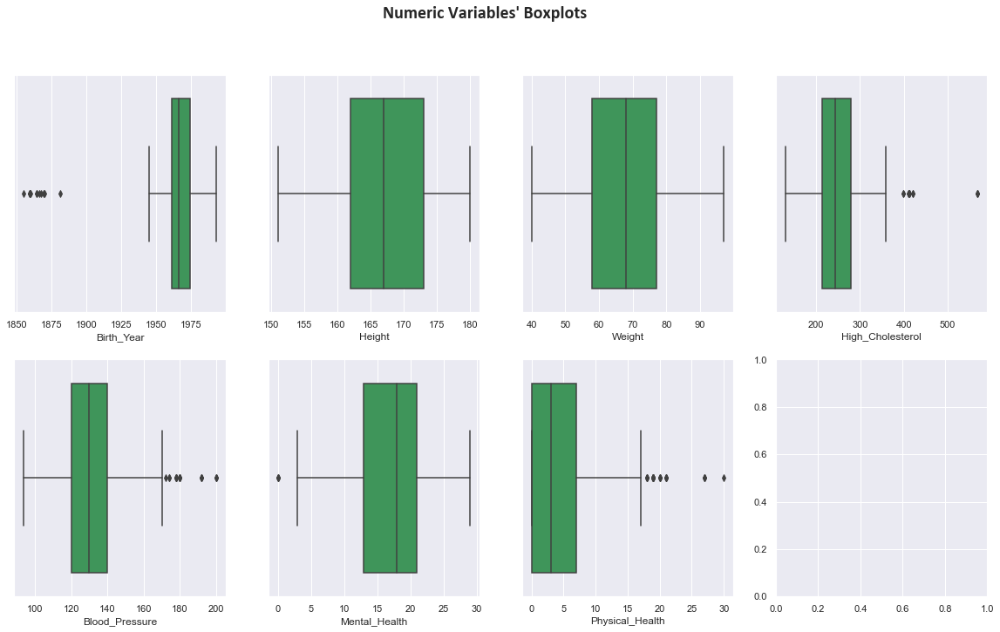

In [20]:
#numeric variables' Boxplots
sns.set()

#plot data
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=train[feat], ax=ax, color='#31a354')

title = "Numeric Variables' Boxplots"

plt.suptitle(title, size=20, weight='bold', family='Calibri')

plt.show()
#plt.savefig(os.path.join('..', 'figures', 'outliers.png'), dpi=200)

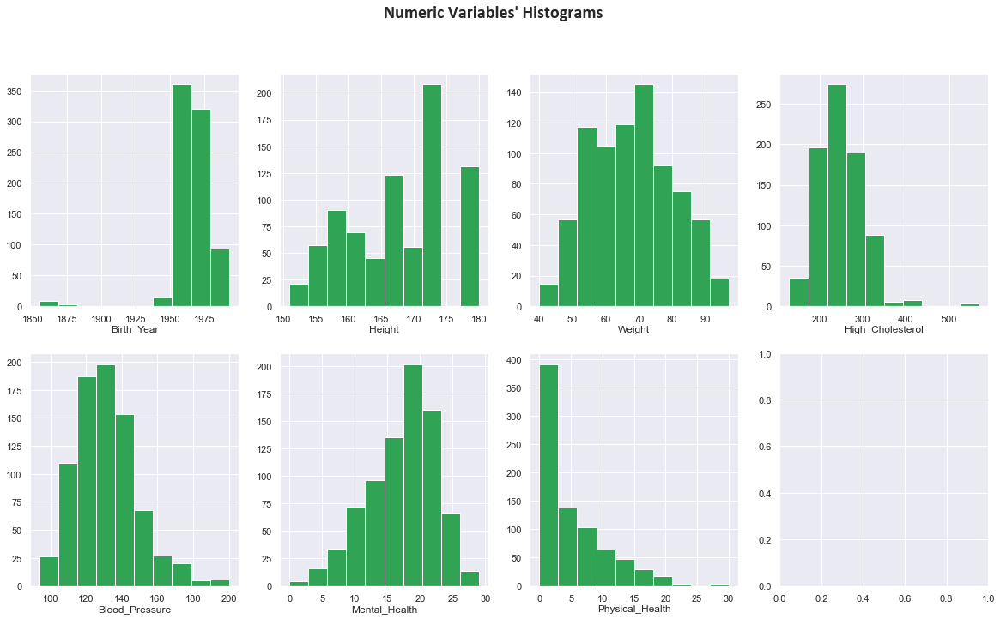

In [21]:
# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(
        axes.flatten(),
        metric_features):  # Notice the zip() function and flatten() method
    ax.hist(new_train[feat], color='#31a354')
    ax.set_title(feat, y=-0.13)

# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title, size=20, weight='bold', family='Calibri')

plt.show()
#plt.savefig(os.path.join('..', 'figures', 'Numeric Variables Histograms.png'), dpi=200)

* High_Cholesterol

Text(0.5, 0, 'High_Cholesterol')

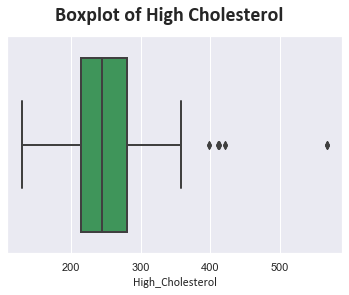

In [22]:
sns.boxplot(x='High_Cholesterol', data=train, color='#31a354', linewidth=2)
title = "Boxplot of High Cholesterol"
plt.suptitle(title, size=20, weight='bold', family='Calibri')
plt.xlabel('High_Cholesterol', family='Calibri')
#plt.savefig(os.path.join('..', 'figures', 'outliers_high_cholesterol.png'), dpi=200

In [23]:
Q3 = np.percentile(train['High_Cholesterol'], 75, interpolation = 'midpoint')
Q1 = np.percentile(train['High_Cholesterol'], 25, interpolation = 'midpoint')
IQR = Q3 - Q1
train[train['High_Cholesterol'] > (Q3+1.5*IQR)]

,PatientID,Name,Birth_Year,Region,Education,Disease,Height,Weight,High_Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Checkup,Diabetes,Smoking_Habit,Drinking_Habit,Exercise,Fruit_Habit,Water_Habit
22,1464,Mrs. Jeanne Rogers,1955,East Midlands,High School Incomplete (10th to 11th grade),1,166,57,568,115,20,7,Not sure,I have/had pregnancy diabetes or borderline di...,No,I consider myself a social drinker,No,Less than 1. I do not consume fruits every day.,Between one liter and two liters
61,1481,Mrs. Lisa Cooks,1859,East Midlands,High School Graduate,0,157,57,411,150,19,19,Not sure,Neither I nor my immediate family have diabetes.,No,I consider myself a social drinker,No,5 to 6 pieces of fruit in average,More than half a liter but less than one liter
103,1685,Mrs. Bonnie Johnson,1959,London,High School Graduate,0,172,58,411,150,19,19,Not sure,Neither I nor my immediate family have diabetes.,No,I consider myself a social drinker,No,5 to 6 pieces of fruit in average,More than half a liter but less than one liter
147,1255,Mrs. Jacqueline Revard,1960,London,Elementary School (1st to 9th grade),1,154,55,398,140,19,5,More than 3 years,Neither I nor my immediate family have diabetes.,No,I consider myself a social drinker,No,Less than 1. I do not consume fruits every day.,Between one liter and two liters
312,1158,Mrs. Mary Hollingsworth,1855,South West,Elementary School (1st to 9th grade),1,151,47,568,115,20,7,Not sure,I have/had pregnancy diabetes or borderline di...,No,I consider myself a social drinker,No,Less than 1. I do not consume fruits every day.,More than half a liter but less than one liter
473,1996,Mrs. Karl Gurry,1966,North West,Elementary School (1st to 9th grade),0,157,51,413,134,18,9,Not sure,Neither I nor my immediate family have diabetes.,No,I consider myself a social drinker,Yes,3 to 4 pieces of fruit in average,Between one liter and two liters
586,1665,Mrs. Melanie Howard,1957,South West,High School Incomplete (10th to 11th grade),1,157,62,421,140,19,3,More than 3 years,I have/had pregnancy diabetes or borderline di...,Yes,I consider myself a social drinker,No,1 to 2 pieces of fruit in average,Between one liter and two liters
720,1123,Mrs. Sheena Kelly,1957,London,I never attended school / Other,1,157,69,421,140,19,3,More than 3 years,I have/had pregnancy diabetes or borderline di...,Yes,I consider myself a social drinker,No,1 to 2 pieces of fruit in average,Less than half a liter
729,1192,Mrs. Karen Smallidge,1955,London,I never attended school / Other,1,172,67,568,115,20,7,Not sure,I have/had pregnancy diabetes or borderline di...,No,I consider myself a social drinker,No,Less than 1. I do not consume fruits every day.,Between one liter and two liters
757,1179,Mrs. Peggy Moore,1966,London,High School Incomplete (10th to 11th grade),0,155,56,413,134,18,9,Not sure,Neither I nor my immediate family have diabetes.,No,I consider myself a social drinker,Yes,3 to 4 pieces of fruit in average,More than half a liter but less than one liter


* Blood_Pressure

Text(0.5, 0, 'Blood_Pressure')

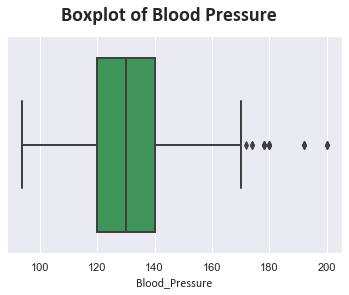

In [24]:
sns.boxplot(x='Blood_Pressure', data = train, color='#31a354', linewidth=2)
title = "Boxplot of Blood Pressure"
plt.suptitle(title, size=20, weight='bold', family='Calibri')
plt.xlabel('Blood_Pressure', family='Calibri')
#plt.savefig(os.path.join('..', 'figures', 'outliers_Blodd_pressure.png'), dpi=200)

* Birth Year

Text(0.5, 0, 'Birth_Year')

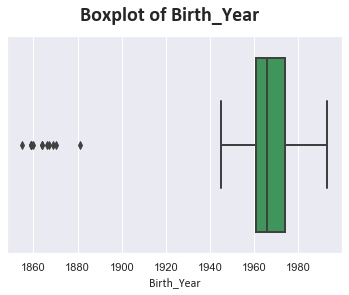

In [25]:
sns.boxplot(x='Birth_Year', data=train, color='#31a354', linewidth=2)
title = "Boxplot of Birth_Year"
plt.suptitle(title, size=20, weight='bold', family='Calibri')
plt.xlabel('Birth_Year', family='Calibri')
#plt.savefig(os.path.join('..', 'figures', 'outliers_BirthYear.png'), dpi=200)

## Treat Outliers

In [26]:
#clip values according to the p1% and p99%
for col in new_train['Birth_Year']:
    percentiles = new_train['Birth_Year'].quantile([0.01, 0.99]).values
    new_train['Birth_Year'] = np.clip(new_train['Birth_Year'], percentiles[0], percentiles[1]) 

In [27]:
#clip values according to the p1% and p9%
for col in new_train['High_Cholesterol']:
    percentiles = new_train['High_Cholesterol'].quantile([0.01, 0.99]).values
    new_train['High_Cholesterol'] = np.clip(new_train['High_Cholesterol'], percentiles[0], percentiles[1])

## Feature Engineering 

### Variables Creation

* Gender

In [28]:
new_train['Prefix'] = new_train['Name'].apply(lambda x: str(x).split(" ")[0])

Prefix_list = new_train['Prefix'].to_list()
Male_list = [1] * len(new_train['Prefix'])

for index, item in enumerate(new_train['Prefix']):
    if item == 'Mr.':
        Male_list[index] = 1

new_train['Male'] = np.transpose(Male_list)
new_train.drop(columns=['Prefix'], inplace=True)

In [29]:
metric_features.append('Male')

* Age

In [30]:
new_train['Age'] = 2022 - new_train['Birth_Year']

In [31]:
new_train.drop(columns = ['Birth_Year'], inplace=True)
metric_features.remove('Birth_Year')
metric_features.append('Age')

* IMC

In [32]:
new_train["IMC"] = new_train["Weight"] / ((new_train["Height"]/100)**2)

In [33]:
new_train.drop(columns = ['Weight','Height'], inplace=True)
metric_features.remove('Weight')
metric_features.remove('Height')
metric_features.append('IMC')

### Reclassify variables 

* Rename columns

In [34]:
new_train = new_train.rename(
    columns={
        'PatientID': 'ID',
        'Education': 'Educ',
        'High_Cholesterol': 'Cholesterol',
        'Smoking_Habit': 'Smoking',
        'Drinking_Habit': 'Drinking',
        'Fruit_Habit': 'Fruit',
        'Water_Habit': 'Water'
    })

In [35]:
metric_features[0] = 'Cholesterol'
non_metric_features[2] = 'Educ'
non_metric_features[6] = 'Smoking'
non_metric_features[7] = 'Drinking'
non_metric_features[9] = 'Fruit'
non_metric_features[10] = 'Water'

* Reclassifying Region

In [36]:
new_train['Region'].replace('LONDON', 'London', inplace=True)

## Incoherence Checking

* Abnormal values related to Weight and Height (using variable IMC)

Text(0.5, 0, 'IMC')

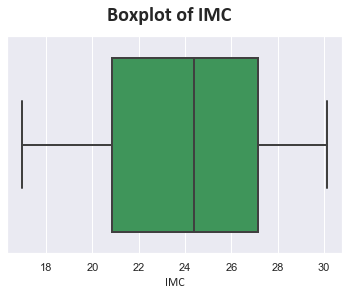

In [37]:
sns.boxplot(x='IMC', data = new_train, color='#31a354', linewidth=2)
title = "Boxplot of IMC"
plt.suptitle(title, size=20, weight='bold', family='Calibri')
plt.xlabel('IMC', family='Calibri')

* Abnormal level of education for patient age

In [38]:
educ_conditions = [
    (new_train['Educ'] == 'Elementary School (1st to 9th grade)'),
    (new_train['Educ'] == 'High School Incomplete (10th to 11th grade)'),
    (new_train['Educ'] == 'High School Graduate'),
    (new_train['Educ'] == 'University Incomplete (1 to 2 years)'),
    (new_train['Educ'] == 'University Complete (3 or more years)')
]

educ_values = [14, 15, 17, 18, 21]

new_train['Educ_num'] = np.select(educ_conditions, educ_values)

In [39]:
new_train.loc[new_train['Educ_num'] > new_train['Age']]

,ID,Name,Region,Educ,Disease,Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Checkup,Diabetes,Smoking,Drinking,Exercise,Fruit,Water,Male,Age,IMC,Educ_num


In [40]:
new_train.drop(columns='Educ_num', inplace=True)

* Underage people that have smoking and drinking habit

In [41]:
new_train.loc[(new_train['Age'] < 18) & (new_train['Smoking'] == 'Yes') &
              (new_train['Drinking'] != 'I consider myself a social drinker')
              &
              (new_train['Drinking'] != 'I usually consume alcohol every day')]

,ID,Name,Region,Educ,Disease,Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Checkup,Diabetes,Smoking,Drinking,Exercise,Fruit,Water,Male,Age,IMC


# Visualizations

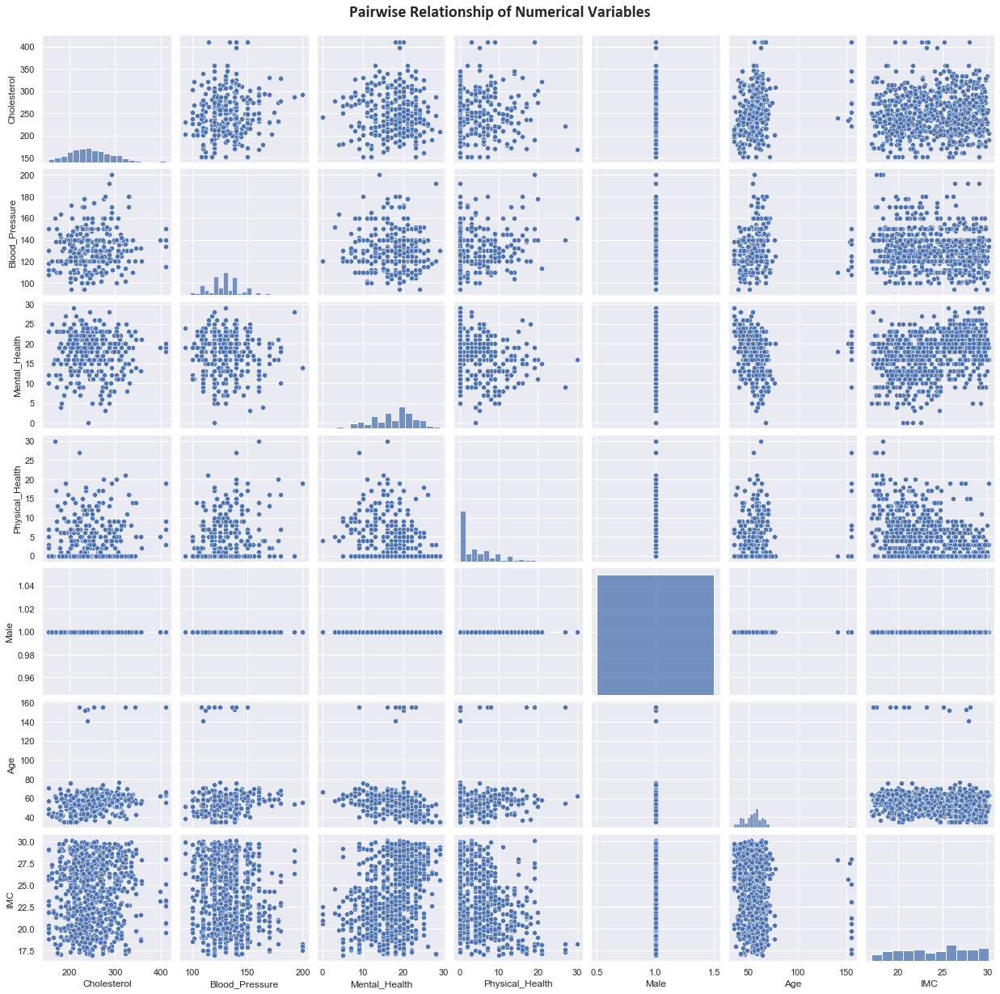

In [42]:
# Pairwise Relationship of Numerical Variables
palette = sns.light_palette("seagreen", as_cmap=True)
sns.set()

# Setting pairplot
sns.pairplot(new_train[metric_features], palette='#31a354', diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20, family='Calibri', weight='bold')

plt.show()

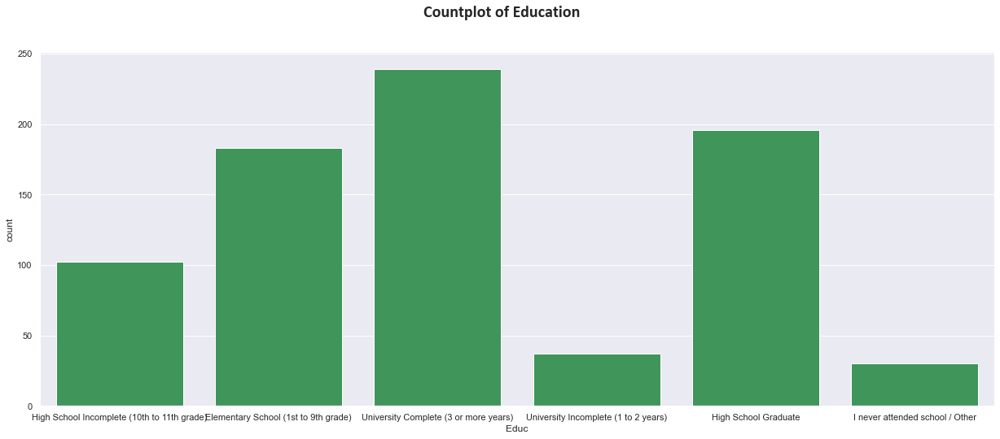

In [43]:
# formatting the color of a simple bar chart
sns.set(rc={'figure.figsize': (21, 8)})

sns.countplot(x=new_train["Educ"], color='#31a354')
title = "Countplot of Education"
plt.suptitle(title, size=20, weight='bold', family='Calibri')

plt.show()
#plt.savefig(os.path.join('..', 'figures', 'CountEduc.png'), dpi=200)

Text(0.5, 0.98, 'Countplot of Gender')

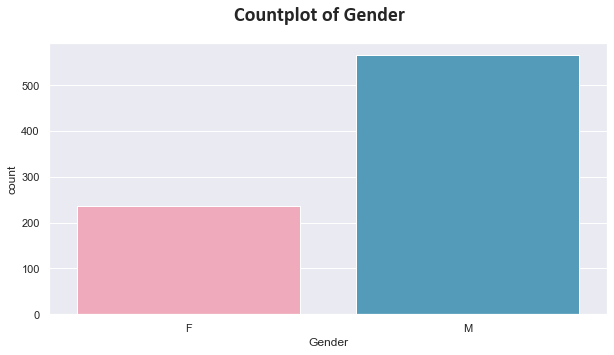

In [44]:
# Calculate 'Gender'
new_train['Prefix'] = new_train['Name'].apply(lambda x: str(x).split(" ")[0])

Prefix_list = new_train['Prefix'].to_list()
Male_list = ['F'] * len(new_train['Prefix'])

for index, item in enumerate(new_train['Prefix']):
    if item == 'Mr.':
        Male_list[index] = 'M'

new_train['Gender'] = np.transpose(Male_list)

# Plot
sns.set(rc={'figure.figsize': (10, 5)})
sns.countplot(x='Gender', data=new_train,
              palette=['#fa9fb5', '#43a2ca'])
title = "Countplot of Gender"
plt.suptitle(title, size=20, weight='bold', family='Calibri')

#plt.savefig(os.path.join('..', 'figures', 'CountGender.png'), dpi=200)

Text(0.5, 0.98, 'Countplot of Cholesterol levels')

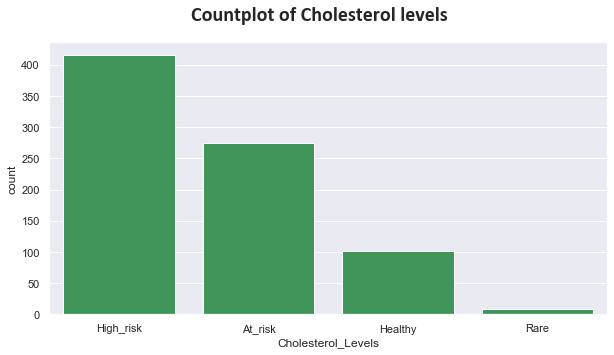

In [45]:
conditions = [
    (new_train['Cholesterol'] < 200),
    (new_train['Cholesterol'] >= 200) & (new_train['Cholesterol'] < 240),
    (new_train['Cholesterol'] >= 240) & (new_train['Cholesterol'] < 400),
    (new_train['Cholesterol'] >= 400)
]

values = ['Healthy', 'At_risk', 'High_risk', 'Rare']

new_train['Cholesterol_Levels'] = np.select(conditions, values)

sns.set(rc={'figure.figsize': (10, 5)})
sns.countplot(x='Cholesterol_Levels', data=new_train,
              color='#31a354')
title = "Countplot of Cholesterol levels"
plt.suptitle(title, size=20, weight='bold', family='Calibri')

#plt.savefig(os.path.join('..', 'figures', 'CountCholesterol.png'), dpi=200)

Text(0.5, 0.98, 'Violinplot of Gender and Cholesterol')

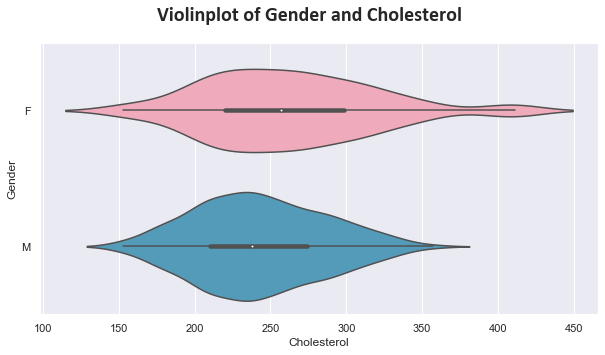

In [46]:
ax = sns.violinplot(x = 'Cholesterol', y='Gender', data=new_train,palette=['#fa9fb5','#43a2ca'])
title = "Violinplot of Gender and Cholesterol"
plt.suptitle(title, size=20, weight='bold', family='Calibri')
#plt.savefig(os.path.join('..', 'figures', 'Cholesterol by Gender.png'), dpi=200)

Text(0.5, 0.98, 'Violinplot of Smoking and Age')

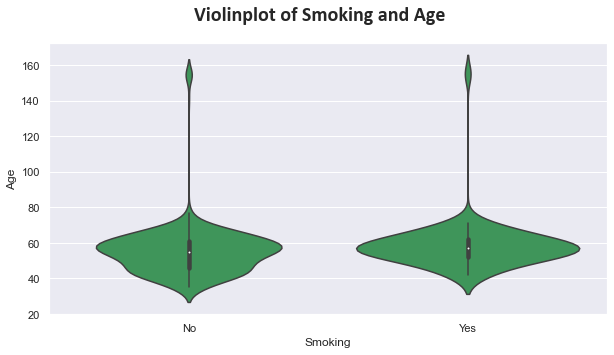

In [47]:
ax = sns.violinplot(x = 'Smoking', y='Age', data=new_train,color='#31a354')
title = "Violinplot of Smoking and Age"
plt.suptitle(title, size=20, weight='bold', family='Calibri')
#plt.savefig(os.path.join('..', 'figures', 'Smoking by age.png'), dpi=200)

In [48]:
#Delete variables that were created for the sole purpose of visualizations
new_train.drop(columns = 'Prefix', inplace=True)
new_train.drop(columns = 'Gender', inplace=True)
new_train.drop(columns = 'Cholesterol_Levels', inplace=True)

# Feature Selection

## Irrelevant Variables

In [49]:
new_train.drop(columns = ['Name'], inplace = True)

In [50]:
non_metric_features.remove('Name')

## Spearman Correlation

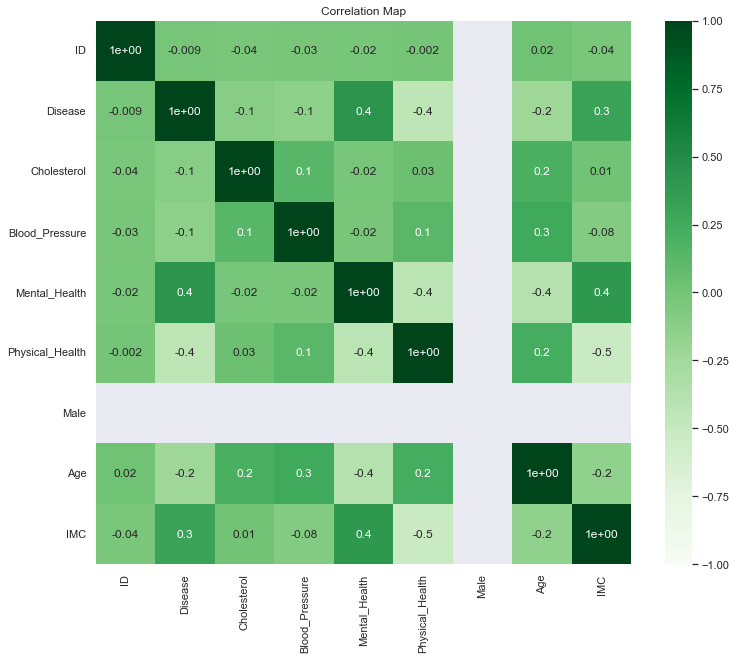

<Figure size 720x360 with 0 Axes>

In [51]:
def cor_heatmap(cor):
    plt.figure(figsize=(12, 10))
    sns.heatmap(data=cor, annot=True, cmap="Greens", fmt='.1', vmin=-1,
                vmax=1).set(title='Correlation Map')
    plt.show()


cor_spearman = new_train.corr(method='spearman')
cor_heatmap(cor_spearman)

#plt.savefig(os.path.join('..', 'figures', 'correlationMap.png'), dpi=200)
plt.savefig('result.png', bbox_inches='tight', pad_inches=1)

In [52]:
corr_spearman = new_train.corr(method='spearman')
corr_spearman

,ID,Disease,Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Male,Age,IMC
ID,1.000000,-0.008669,-0.036495,-0.028290,-0.021472,-0.001583,NaN,0.019858,-0.036998
Disease,-0.008669,1.000000,-0.107775,-0.135463,0.424439,-0.435109,NaN,-0.228167,0.312274
Cholesterol,-0.036495,-0.107775,1.000000,0.136836,-0.021549,0.032430,NaN,0.207738,0.014972
Blood_Pressure,-0.028290,-0.135463,0.136836,1.000000,-0.024775,0.127004,NaN,0.261092,-0.082905
Mental_Health,-0.021472,0.424439,-0.021549,-0.024775,1.000000,-0.415473,NaN,-0.373902,0.392114
Physical_Health,-0.001583,-0.435109,0.032430,0.127004,-0.415473,1.000000,NaN,0.231045,-0.521640
Male,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Age,0.019858,-0.228167,0.207738,0.261092,-0.373902,0.231045,NaN,1.000000,-0.152226
IMC,-0.036998,0.312274,0.014972,-0.082905,0.392114,-0.521640,NaN,-0.152226,1.000000


## Chi-Square test of independence

In [53]:
def chi_square(col1, col2):
    print("Variable", col1, "with", col2, ":")
    for i in range(len(non_metric_features)):

        # Chi Square test between the variables col1 and col2
        info = pd.crosstab(new_train[col1], new_train[col2])

        # We are calculating the chi square values, the p-value, the degrees of freedom and an array of expected values.
        chiVal, pVal, df, exp = stats.chi2_contingency(info)
        chiVal, pVal, df, exp

        #Check Assumptions:
        count_expected_less_5 = 0
        count_expected_less_1 = 0

        #(1) there is no expected value inferior to 1
        for i in range(exp.shape[0]):
            if count_expected_less_1 > 0:
                break
            for j in range(exp.shape[1]):
                if exp[i, j] < 1:
                    print(
                        'Assumption Violation: There is at least 1 expected value inferior to 1'
                    )
                    count_expected_less_1 += 1
                    break
                if exp[i, j] < 5:
                    count_expected_less_5 += 1

        #(2) at least 20% of the values should be inferior to 5
        if (count_expected_less_5 / (exp.shape[0] * exp.shape[1])) < 0.2:
            print(
                'Assumption Violation: There is less than 20% of observations inferior to 5'
            )
            print(
                '____________________________________________________________________________________________________\n'
            )
            break
        else:
            crosstab, test_results, expected = researchpy.crosstab(
                new_train[col1],
                new_train[col2],
                test="chi-square",
                expected_freqs=True,
                prop="cell")
            print(test_results)
            print(
                '____________________________________________________________________________________________________\n'
            )
            break

In [54]:
#Variable pairs with assumptions violated
chi_square('Region', 'Checkup')
chi_square('Region', 'Diabetes')
chi_square('Region', 'Smoking')
chi_square('Region', 'Drinking')
chi_square('Region', 'Exercise')
chi_square('Region', 'Fruit')
chi_square('Region', 'Water')
chi_square('Checkup', 'Diabetes')
chi_square('Checkup', 'Smoking')
chi_square('Checkup', 'Drinking')
chi_square('Checkup', 'Fruit')
chi_square('Checkup', 'Water')
chi_square('Diabetes', 'Smoking')
chi_square('Diabetes', 'Drinking')
chi_square('Diabetes', 'Exercise')
chi_square('Diabetes', 'Fruit')
chi_square('Diabetes', 'Water')
chi_square('Smoking', 'Drinking')
chi_square('Smoking', 'Exercise')
chi_square('Smoking', 'Fruit')
chi_square('Smoking', 'Water')
chi_square('Drinking', 'Exercise')
chi_square('Drinking', 'Fruit')
chi_square('Exercise', 'Fruit')
chi_square('Exercise', 'Water')
chi_square('Fruit', 'Water')

Variable Region with Checkup :
Assumption Violation: There is at least 1 expected value inferior to 1
Assumption Violation: There is less than 20% of observations inferior to 5
____________________________________________________________________________________________________

Variable Region with Diabetes :
Assumption Violation: There is less than 20% of observations inferior to 5
____________________________________________________________________________________________________

Variable Region with Smoking :
Assumption Violation: There is less than 20% of observations inferior to 5
____________________________________________________________________________________________________

Variable Region with Drinking :
Assumption Violation: There is at least 1 expected value inferior to 1
Assumption Violation: There is less than 20% of observations inferior to 5
____________________________________________________________________________________________________

Variable Region with Exe

In [55]:
#Variable pair with correct assumptions
chi_square('Drinking', 'Water')
chi_square('Checkup', 'Exercise')
#We discovered that that is a dependence between Drinking and Water. Also there is independence between checkup and exercise
#Regarding the other pairs of variables no conclusions could be withdrawn because there were assumptions violated

Variable Drinking with Water :
                Chi-square test  results
0  Pearson Chi-square ( 4.0) =    2.3429
1                    p-value =    0.6730
2                 Cramer's V =    0.0383
____________________________________________________________________________________________________

Variable Checkup with Exercise :
                Chi-square test  results
0  Pearson Chi-square ( 3.0) =   87.1132
1                    p-value =    0.0000
2                 Cramer's V =    0.3300
____________________________________________________________________________________________________



# Dummies

In [56]:
#create a dataframe with only categorical variables
new_train_cat = new_train.copy(deep=True)

non_metric_features.append('ID')
new_train_cat = new_train_cat[non_metric_features]

new_train_cat = new_train_cat.set_index('ID')
non_metric_features.remove('ID')

#get categorical variables as numeric (dummy)
cat_to_dummy = pd.get_dummies(new_train_cat, drop_first=True)

#get numeric variables
metric_features.append('ID')
new_train_num = new_train[metric_features].copy()
new_train_num = new_train_num.set_index('ID')
metric_features.remove('ID')

#merge the numerical features and the categorical dummy features
dummy = pd.merge(new_train_num, cat_to_dummy, on='ID')

# Data Scaling

In [57]:
#scaling method: min-max normalization
indep = dummy.drop('Disease', axis=1)
target = dummy['Disease']

scale = MinMaxScaler().fit(indep)
minmax_data = scale.transform(indep)

indep = pd.DataFrame(minmax_data, columns=indep.columns)
indep

,Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Male,Age,IMC,Region_East of England,Region_London,Region_North East,...,Smoking_Yes,Drinking_I do not consume any type of alcohol,Drinking_I usually consume alcohol every day,Exercise_Yes,Fruit_3 to 4 pieces of fruit in average,Fruit_5 to 6 pieces of fruit in average,Fruit_Less than 1. I do not consume fruits every day.,Fruit_More than six pieces of fruit,Water_Less than half a liter,Water_More than half a liter but less than one liter
0,0.794574,0.245283,0.724138,0.066667,0.0,0.183333,0.830206,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.298450,0.452830,0.310345,0.000000,0.0,0.150000,0.945490,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.282946,0.264151,0.896552,0.000000,0.0,0.108333,0.679802,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,0.620155,0.292453,0.448276,0.266667,0.0,0.241667,0.258296,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
4,0.480620,0.292453,0.620690,0.066667,0.0,0.158333,0.070444,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,0.197674,0.471698,0.413793,0.133333,0.0,0.125000,0.173257,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
796,0.232558,0.245283,0.793103,0.000000,0.0,0.058333,0.591303,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
797,0.461240,0.433962,0.689655,0.566667,0.0,1.000000,0.017938,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
798,0.213178,0.169811,0.551724,0.000000,0.0,0.100000,0.804384,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


# Treat Missing Values: KNN

In [58]:
# The best method to imput our missings was KNN, since it does't bias our results as much as other methods
imputer = KNNImputer(n_neighbors=5)
indep_knn = pd.DataFrame(imputer.fit_transform(indep), columns=indep.columns)

# Feature Reduction: PCA

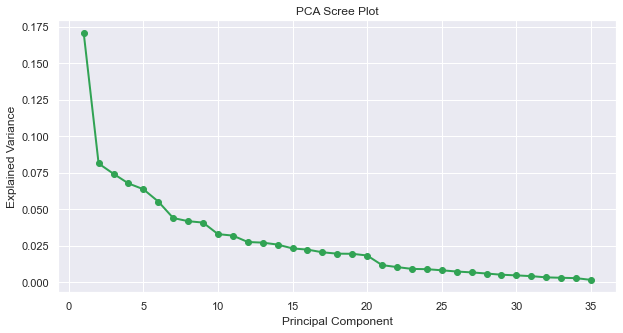

In [59]:
pca = PCA(n_components=35)
pca_fit = pca.fit(indep_knn)

PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values,
         pca.explained_variance_ratio_,
         'o-',
         linewidth=2,
         color='#31a354')
plt.title('PCA Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance')
plt.show()

In [60]:
print(pca.explained_variance_ratio_)
#We will retain at maximum only 0.175 of all information, so we will not proceed using PCA

[0.17074934 0.08126888 0.07420088 0.06761906 0.06364033 0.0552127
 0.04393048 0.0417675  0.04079743 0.03291466 0.03188289 0.02751062
 0.02707615 0.02573796 0.02310646 0.02229454 0.02046427 0.01952003
 0.01943717 0.01826294 0.01166917 0.01034615 0.00909128 0.0088982
 0.00814141 0.00729566 0.00670089 0.00592929 0.00510295 0.00465721
 0.00413148 0.00330126 0.00301056 0.00276862 0.00156157]


# Dataframe Split

In [61]:
skf = StratifiedKFold(n_splits=10, random_state=None)
skf

StratifiedKFold(n_splits=10, random_state=None, shuffle=False)

In [62]:
X = indep_knn.copy()
y = target.copy()
StratifiedKFold(n_splits=10, random_state=None, shuffle=False)
for train_index, val_index in skf.split(X, y):
    # get the indexes of the observations assigned for each partition
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

# Feature Selection: Statistical Tests

## DM Chi-Square test of independence

In [63]:
train_cat = new_train_cat.drop(columns='Disease')
train_cat = cat_to_dummy.drop(columns='Disease')

In [64]:
X = train_cat.copy()
y = target.copy()
skf = StratifiedKFold(n_splits=10, random_state=None, shuffle=False)
for train_index, val_index in skf.split(X, y):
    # get the indexes of the observations assigned for each partition
    X_train_cat, X_val_cat = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

In [65]:
def TestIndependence(X, y, var, alpha=0.05):
    dfObserved = pd.crosstab(y, X)
    chi2, p, dof, expected = stats.chi2_contingency(dfObserved.values)
    dfExpected = pd.DataFrame(expected,
                              columns=dfObserved.columns,
                              index=dfObserved.index)
    if p < alpha:
        #result="{0} is IMPORTANT for Prediction".format(var)
        print(var)

In [66]:
for var in X_train_cat:
    TestIndependence(X_train_cat[var], y_train, var)

Checkup_More than 3 years
Checkup_Not sure
Diabetes_I have/had pregnancy diabetes or borderline diabetes
Diabetes_Neither I nor my immediate family have diabetes.
Drinking_I usually consume alcohol every day
Exercise_Yes
Fruit_3 to 4 pieces of fruit in average
Fruit_5 to 6 pieces of fruit in average
Fruit_Less than 1. I do not consume fruits every day.


## RFE

In [67]:
# Calculate the optimum number of features
#no of features
nof_list = list(range(1, 36))
high_score = 0
#Variable to store the optimum features
nof = 0
score_list = []
for n in nof_list:
    model = LogisticRegression()
    rfe = RFE(model, n_features_to_select=n)
    X_train_rfe = rfe.fit_transform(X_train, y_train)
    X_val_rfe = rfe.transform(X_val)
    model.fit(X_train_rfe, y_train)

    score = model.score(X_val_rfe, y_val)
    score_list.append(score)

    if (score > high_score):
        high_score = score
        nof = nof_list[n]
print("Optimum number of features: %d" % nof)
print("Score with %d features: %f" % (nof, high_score))

Optimum number of features: 13
Score with 13 features: 0.887500


* RFE using Decision Trees

In [68]:
model = DecisionTreeClassifier()
rfe = RFE(estimator=model, n_features_to_select=18)
X_rfe = rfe.fit_transform(X=indep_knn, y=target)
selected_features = pd.Series(rfe.support_, index=indep_knn.columns)

selected_features.loc[selected_features == True]

Cholesterol                                                                            True
Blood_Pressure                                                                         True
Mental_Health                                                                          True
Physical_Health                                                                        True
Age                                                                                    True
IMC                                                                                    True
Region_East of England                                                                 True
Region_South West                                                                      True
Educ_High School Incomplete (10th to 11th grade)                                       True
Checkup_More than 3 years                                                              True
Checkup_Not sure                                                                

* RFE using Logistic regression

In [69]:
model = LogisticRegression(max_iter=1000000)
rfe = RFE(estimator=model, n_features_to_select=18)
X_rfe = rfe.fit_transform(X=indep_knn, y=target)
selected_features = pd.Series(rfe.support_, index=indep_knn.columns)

selected_features.loc[selected_features == True]

Cholesterol                                                      True
Blood_Pressure                                                   True
Mental_Health                                                    True
Physical_Health                                                  True
IMC                                                              True
Region_East of England                                           True
Region_West Midlands                                             True
Educ_University Incomplete (1 to 2 years)                        True
Checkup_Less than three months                                   True
Checkup_More than 3 years                                        True
Checkup_Not sure                                                 True
Diabetes_I have/had pregnancy diabetes or borderline diabetes    True
Diabetes_Neither I nor my immediate family have diabetes.        True
Drinking_I usually consume alcohol every day                     True
Exercise_Yes        

## KBest

In [70]:
selector = SelectKBest(score_func=chi2, k=18)
selector.fit_transform(indep_knn, target)
indep_knn.columns[selector.get_support()]

Index(['Mental_Health', 'Physical_Health', 'Age', 'IMC',
       'Educ_High School Graduate', 'Checkup_More than 3 years',
       'Checkup_Not sure',
       'Diabetes_I don't have diabetes, but I have direct family members who have diabetes.',
       'Diabetes_I have/had pregnancy diabetes or borderline diabetes',
       'Diabetes_Neither I nor my immediate family have diabetes.',
       'Smoking_Yes', 'Drinking_I do not consume any type of alcohol',
       'Drinking_I usually consume alcohol every day', 'Exercise_Yes',
       'Fruit_3 to 4 pieces of fruit in average',
       'Fruit_5 to 6 pieces of fruit in average',
       'Fruit_Less than 1. I do not consume fruits every day.',
       'Fruit_More than six pieces of fruit'],
      dtype='object')

## ANOVA

In [71]:
df_melt = pd.melt(
    indep_knn.reset_index(),
    id_vars=['index'],
    value_vars=[
        'Cholesterol', 'Blood_Pressure', 'Mental_Health', 'Physical_Health',
        'Male', 'Age', 'IMC', 'Region_East of England', 'Region_London',
        'Region_North East', 'Region_North West', 'Region_South East',
        'Region_South West', 'Region_West Midlands',
        'Region_Yorkshire and the Humber', 'Educ_High School Graduate',
        'Educ_High School Incomplete (10th to 11th grade)',
        'Educ_I never attended school / Other',
        'Educ_University Complete (3 or more years)',
        'Educ_University Incomplete (1 to 2 years)',
        'Checkup_Less than three months', 'Checkup_More than 3 years',
        'Checkup_Not sure',
        "Diabetes_I don't have diabetes, but I have direct family members who have diabetes.",
        'Diabetes_I have/had pregnancy diabetes or borderline diabetes',
        'Diabetes_Neither I nor my immediate family have diabetes.',
        'Smoking_Yes', 'Drinking_I do not consume any type of alcohol',
        'Drinking_I usually consume alcohol every day', 'Exercise_Yes',
        'Fruit_3 to 4 pieces of fruit in average',
        'Fruit_5 to 6 pieces of fruit in average',
        'Fruit_Less than 1. I do not consume fruits every day.',
        'Fruit_More than six pieces of fruit', 'Water_Less than half a liter',
        'Water_More than half a liter but less than one liter'
    ])
# replace column names
df_melt.columns = ['index', 'treatments', 'value']
df_melt

,index,treatments,value
0,0,Cholesterol,0.794574
1,1,Cholesterol,0.298450
2,2,Cholesterol,0.282946
3,3,Cholesterol,0.620155
4,4,Cholesterol,0.480620
...,...,...,...
28795,795,Water_More than half a liter but less than one...,0.000000
28796,796,Water_More than half a liter but less than one...,0.000000
28797,797,Water_More than half a liter but less than one...,1.000000
28798,798,Water_More than half a liter but less than one...,1.000000


In [72]:
model = ols('value ~ C(treatments)', data=df_melt).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(treatments),966.679085,35.0,253.321531,0.0
Residual,3136.111207,28764.0,NaN,NaN


In [73]:
#First let's check if the ANOVA assumptions are met
#Using the saphiro-wilk test we are able to understand if the data is drawn from a normal distribution
w, pvalue = stats.shapiro(model.resid)
print(w, pvalue)
#P-value is 0 so we don't reject the null hypotheses, meaning that we violate that assumption therefore we cannot apply ANOVA test

0.8583728075027466 0.0


## Mutual Info Classification

In [74]:
selector = sklearn.feature_selection.mutual_info_classif(
    indep_knn,
    target,
    discrete_features='auto',
    n_neighbors=18,
    copy=True,
    random_state=None)
selector

array([4.46513680e-02, 2.20998641e-02, 9.80276306e-02, 1.44836541e-01,
       5.82479324e-05, 4.84782402e-02, 8.69489322e-02, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.09134821e-02,
       5.53782635e-03, 0.00000000e+00, 2.52138045e-02, 7.46054278e-03,
       1.06582180e-02, 2.69105830e-04, 0.00000000e+00, 2.37396956e-03,
       7.13567078e-03, 1.40783334e-01, 1.13161006e-01, 7.21513986e-03,
       4.38125784e-02, 1.38732762e-01, 0.00000000e+00, 0.00000000e+00,
       1.09465717e-02, 8.74911359e-02, 4.19311272e-02, 2.13001609e-02,
       1.15227171e-01, 6.43518621e-03, 0.00000000e+00, 0.00000000e+00])

In [75]:
columns = list(indep_knn.columns)
final_selector = pd.DataFrame({'Variable': columns, 'Value': selector})
final_selector

,Variable,Value
0,Cholesterol,0.044651
1,Blood_Pressure,0.022100
2,Mental_Health,0.098028
3,Physical_Health,0.144837
4,Male,0.000058
5,Age,0.048478
6,IMC,0.086949
7,Region_East of England,0.000000
8,Region_London,0.000000
9,Region_North East,0.000000


## Lasso

In [76]:
scaler = StandardScaler()
scaler.fit(X_train)
sel_ = SelectFromModel(
    LogisticRegression(C=0.5,
                       penalty='l1',
                       solver='liblinear',
                       random_state=10))
sel_.fit(scaler.transform(X_train), y_train)

SelectFromModel(estimator=LogisticRegression(C=0.5, penalty='l1',
                                             random_state=10,
                                             solver='liblinear'))

In [77]:
#select features that can be removed
sel_.get_support()
X_train.columns[(sel_.estimator_.coef_ == 0).ravel().tolist()]

Index(['Male', 'Age', 'Region_South West', 'Region_Yorkshire and the Humber',
       'Educ_University Complete (3 or more years)',
       'Fruit_5 to 6 pieces of fruit in average',
       'Water_More than half a liter but less than one liter'],
      dtype='object')

##  Random Forest

In [78]:
sel = SelectFromModel(RandomForestClassifier(n_estimators=100))
sel.fit(X_train, y_train)

SelectFromModel(estimator=RandomForestClassifier())

In [79]:
#features to retain
sel.get_support()
X_train.columns[(sel.get_support())]

Index(['Cholesterol', 'Blood_Pressure', 'Mental_Health', 'Physical_Health',
       'Age', 'IMC', 'Checkup_More than 3 years', 'Checkup_Not sure',
       'Diabetes_Neither I nor my immediate family have diabetes.',
       'Exercise_Yes',
       'Fruit_Less than 1. I do not consume fruits every day.'],
      dtype='object')

## Feature Selection Summary

In [4]:
statistical_tests = pd.read_excel(r'C:\Users\Joao\Downloads\Model Evaluation.xlsx', sheet_name='Feature selection')
statistical_tests
#plt.savefig('Feature_Selection_Summary.png')

,Variables,Spearman,DM Chi-Square of Independence,RFE K=18 - Decision Trees,RFE K=18 - Logistic Regression,K BEST QUI-SQUARED K=18,Mutual Info Regression,Lasso,Random Forest,%TRUE,DECISION
0,Blood_Pressure,True,False,True,True,False,True,True,True,75.0,KEEP
1,Mental_Health,True,False,True,True,True,True,True,True,87.5,KEEP
2,Physical_Health,True,False,True,True,True,True,True,True,87.5,KEEP
3,Male,True,False,False,False,False,False,False,False,12.5,DROP
4,Age,True,False,True,False,True,False,True,True,62.5,DROP
5,IMC,True,False,True,True,True,False,True,True,75.0,KEEP
6,Cholesterol,True,False,True,True,False,False,True,True,62.5,DROP
7,Region_East of England,True,False,True,True,False,False,True,False,50.0,DROP
8,Region_London,True,False,True,False,False,False,False,False,25.0,DROP
9,Region_North East,True,False,False,False,False,False,True,False,25.0,DROP


# Dataframes creation

<center> <font size="3"> <strong>GENERAL PREPROCESSING NEEDED FOR ALL</strong> </font> </center>

Variables created:
* Male
* Age
* IMC

Variables renamed:
* PatiendID -> ID
* Education ->Educ                               
* High_Cholesterol -> Cholesterol
* Smoking_Habit -> Smoking 
* Drinking_Habit -> Drinking 
* Fruit_Habit -> Fruit
* Water_Habit -> Water

Replaced a wrong spelled class:
* LONDON -> London

Drop a irrelevant variable:
* Name

Create 2 new datasets:
* metric_features - including only the numerical features
* non_metric_features - including only the categorical features

In [224]:
'''#copy of the original dataframe
general_train = train.copy()

#Variable Male Creation
general_train['Prefix'] = general_train['Name'].apply(
    lambda x: str(x).split(" ")[0])
Prefix_list = general_train['Prefix'].to_list()
Male_list = [1] * len(general_train['Prefix'])
for index, item in enumerate(general_train['Prefix']):
    if item == 'Mr.':
        Male_list[index] = 1
general_train['Male'] = np.transpose(Male_list)
general_train.drop(columns=['Prefix'], inplace=True)

#Variable Age Creation
general_train['Age'] = 2022 - general_train['Birth_Year']
general_train.drop(columns=['Birth_Year'], inplace=True)

#Variable IMC Creation
general_train["IMC"] = general_train["Weight"] / (
    (general_train["Height"] / 100)**2)
general_train.drop(columns=['Weight', 'Height'], inplace=True)

#rename variables
general_train = general_train.rename(
    columns={
        'PatientID': 'ID',
        'Education': 'Educ',
        'High_Cholesterol': 'Cholesterol',
        'Smoking_Habit': 'Smoking',
        'Drinking_Habit': 'Drinking',
        'Fruit_Habit': 'Fruit',
        'Water_Habit': 'Water'
    })

#replace a wrong spelled class
general_train['Region'].replace('LONDON', 'London', inplace=True)

#drop irrelevant variable
general_train.drop(columns='Name', inplace=True)

#create datasets with numerical and categorical_features
metric_features = [
    'Age', 'IMC', 'Male', 'Blood_Pressure', 'Mental_Health', 'Physical_Health',
    'Cholesterol'
]
non_metric_features = [
    'Region', 'Educ', 'Checkup', 'Diabetes', 'Smoking', 'Drinking', 'Exercise',
    'Fruit', 'Water'
]'''

'#copy of the original dataframe\ngeneral_train = train.copy()\n\n#Variable Male Creation\ngeneral_train[\'Prefix\'] = general_train[\'Name\'].apply(\n    lambda x: str(x).split(" ")[0])\nPrefix_list = general_train[\'Prefix\'].to_list()\nMale_list = [1] * len(general_train[\'Prefix\'])\nfor index, item in enumerate(general_train[\'Prefix\']):\n    if item == \'Mr.\':\n        Male_list[index] = 1\ngeneral_train[\'Male\'] = np.transpose(Male_list)\ngeneral_train.drop(columns=[\'Prefix\'], inplace=True)\n\n#Variable Age Creation\ngeneral_train[\'Age\'] = 2022 - general_train[\'Birth_Year\']\ngeneral_train.drop(columns=[\'Birth_Year\'], inplace=True)\n\n#Variable IMC Creation\ngeneral_train["IMC"] = general_train["Weight"] / (\n    (general_train["Height"] / 100)**2)\ngeneral_train.drop(columns=[\'Weight\', \'Height\'], inplace=True)\n\n#rename variables\ngeneral_train = general_train.rename(\n    columns={\n        \'PatientID\': \'ID\',\n        \'Education\': \'Educ\',\n        \'High

<center> <font size="3"> <strong>SPECIFIC DATAFRAMES</strong> </font> </center>

**Raw dataset (Keep Outliers + Keep Missing Values)**

In [225]:
'''general_train'''

'general_train'

**Clip Outliers + Treat Missing Values**

Outliers:
* Clip Age 
* Clip Cholesterol

Dummy creation:
* all categorical variables

Data Scaling:
* Min-Max normalization

Missing Values:
* Treat using Knn Imputer (with 5 neighbors)

In [82]:
'''co_tmv = general_train.copy()

#Clip Outliers of Age
for col in co_tmv['Age']:
    percentiles = co_tmv['Age'].quantile([0.01, 0.99]).values
    co_tmv['Age'] = np.clip(co_tmv['Age'], percentiles[0], percentiles[1])

#Clip Outliers of Cholesterol_Levels
for col in co_tmv['Cholesterol']:
    percentiles = co_tmv['Cholesterol'].quantile([0.01, 0.99]).values
    co_tmv['Cholesterol'] = np.clip(co_tmv['Cholesterol'], percentiles[0],
                                    percentiles[1])

#Dummies creation
target = co_tmv['Disease']
final_dataset = co_tmv.copy()
final_dataset.drop(columns='Disease', inplace=True)

final_dataset_cat = final_dataset[[
    'ID', 'Region', 'Educ', 'Checkup', 'Diabetes', 'Smoking', 'Drinking',
    'Exercise', 'Fruit', 'Water'
]]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy
final_dataset_num = final_dataset[[
    'ID', 'Cholesterol', 'Blood_Pressure', 'Mental_Health', 'Physical_Health',
    'Male', 'Age', 'IMC'
]].copy()
final_dataset_num = final_dataset_num.set_index('ID')
final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)
final_dataset

#treat missing values
imputer = KNNImputer(n_neighbors=5)
final_dataset = pd.DataFrame(imputer.fit_transform(final_dataset),
                             columns=final_dataset.columns)'''

**Clip Outliers + Remove Missing Values**

<div class="alert alert-block alert-danger">
IMPORTANT INFORMATION: WE ENDED UP NOT USING THIS DATAFRAME BECAUSE WE REALISE THAT WE CANNOT DELETE OBSERVATIONS

Outliers:
* Clip Age 
* Clip Cholesterol

Missing Values:
* Remove Na's

In [83]:
'''co_rmv = general_train.copy()

#Clip Outliers of Age
for col in co_rmv['Age']:
    percentiles = co_rmv['Age'].quantile([0.01, 0.99]).values
    co_rmv['Age'] = np.clip(co_rmv['Age'], percentiles[0], percentiles[1])

#Clip Outliers of Cholesterol_Levels
for col in co_rmv['Cholesterol']:
    percentiles = co_rmv['Cholesterol'].quantile([0.01, 0.99]).values
    co_rmv['Cholesterol'] = np.clip(co_rmv['Cholesterol'], percentiles[0],
                                    percentiles[1])

#remove missing values
co_rmv = co_rmv.dropna()

#Dummies creation
target = co_rmv['Disease']
final_dataset = co_rmv.copy()
final_dataset.drop(columns='Disease', inplace=True)

non_metric_features.append('ID')
final_dataset_cat = final_dataset[non_metric_features]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy

metric_features.append('ID')
final_dataset_num = final_dataset[metric_features].copy()
final_dataset_num = final_dataset_num.set_index('ID')

final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')
non_metric_features.remove('ID')
metric_features.remove('ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)
final_dataset'''

,Age,IMC,Male,Blood_Pressure,Mental_Health,Physical_Health,Cholesterol,Region_East of England,Region_London,Region_North East,...,Smoking_Yes,Drinking_I do not consume any type of alcohol,Drinking_I usually consume alcohol every day,Exercise_Yes,Fruit_3 to 4 pieces of fruit in average,Fruit_5 to 6 pieces of fruit in average,Fruit_Less than 1. I do not consume fruits every day.,Fruit_More than six pieces of fruit,Water_Less than half a liter,Water_More than half a liter but less than one liter
0,0.183333,0.830206,0.0,0.245283,0.724138,0.066667,0.794574,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.150000,0.945490,0.0,0.452830,0.310345,0.000000,0.298450,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.108333,0.679802,0.0,0.264151,0.896552,0.000000,0.282946,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,0.241667,0.258296,0.0,0.292453,0.448276,0.266667,0.620155,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
4,0.158333,0.070444,0.0,0.292453,0.620690,0.066667,0.480620,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,0.125000,0.173257,0.0,0.471698,0.413793,0.133333,0.197674,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
783,0.058333,0.591303,0.0,0.245283,0.793103,0.000000,0.232558,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
784,1.000000,0.017938,0.0,0.433962,0.689655,0.566667,0.461240,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
785,0.100000,0.804384,0.0,0.169811,0.551724,0.000000,0.213178,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


**Clip Outliers + Keep Misssing Values**

Outliers:
* Clip Age 
* Clip Cholesterol

Missing Values:
* Keep Na's

In [84]:
'''co_kmv = general_train.copy()

#Clip Outliers of Age
for col in co_kmv['Age']:
    percentiles = co_kmv['Age'].quantile([0.01, 0.99]).values
    co_kmv['Age'] = np.clip(co_kmv['Age'], percentiles[0], percentiles[1])

#Clip Outliers of Cholesterol_Levels
for col in co_kmv['Cholesterol']:
    percentiles = co_kmv['Cholesterol'].quantile([0.01, 0.99]).values
    co_kmv['Cholesterol'] = np.clip(co_kmv['Cholesterol'], percentiles[0],
                                    percentiles[1])
#Dummies creation
target = co_kmv['Disease']
final_dataset = co_kmv.copy()
final_dataset.drop(columns='Disease', inplace=True)

non_metric_features.append('ID')
final_dataset_cat = final_dataset[non_metric_features]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy

metric_features.append('ID')
final_dataset_num = final_dataset[metric_features].copy()
final_dataset_num = final_dataset_num.set_index('ID')

final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')
non_metric_features.remove('ID')
metric_features.remove('ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)
final_dataset'''

,Age,IMC,Male,Blood_Pressure,Mental_Health,Physical_Health,Cholesterol,Region_East of England,Region_London,Region_North East,...,Smoking_Yes,Drinking_I do not consume any type of alcohol,Drinking_I usually consume alcohol every day,Exercise_Yes,Fruit_3 to 4 pieces of fruit in average,Fruit_5 to 6 pieces of fruit in average,Fruit_Less than 1. I do not consume fruits every day.,Fruit_More than six pieces of fruit,Water_Less than half a liter,Water_More than half a liter but less than one liter
0,0.183333,0.830206,0.0,0.245283,0.724138,0.066667,0.794574,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.150000,0.945490,0.0,0.452830,0.310345,0.000000,0.298450,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.108333,0.679802,0.0,0.264151,0.896552,0.000000,0.282946,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,0.241667,0.258296,0.0,0.292453,0.448276,0.266667,0.620155,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
4,0.158333,0.070444,0.0,0.292453,0.620690,0.066667,0.480620,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,0.125000,0.173257,0.0,0.471698,0.413793,0.133333,0.197674,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
796,0.058333,0.591303,0.0,0.245283,0.793103,0.000000,0.232558,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
797,1.000000,0.017938,0.0,0.433962,0.689655,0.566667,0.461240,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
798,0.100000,0.804384,0.0,0.169811,0.551724,0.000000,0.213178,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


**Remove Outliers + Treat Missing Values**

<div class="alert alert-block alert-danger">
IMPORTANT INFORMATION: WE ENDED UP NOT USING THIS DATAFRAME BECAUSE WE REALISE THAT WE CANNOT DELETE OBSERVATIONS

Dummy creation:
* all categorical variables

Data Scaling:
* Min-Max normalization

Missing Values:
* Treat using Knn Imputer (with 5 neighbors)

Outliers:
* Remove 

In [85]:
'''ro_tmv = general_train.copy()

#Dummies creation
target = ro_tmv['Disease']
final_dataset = ro_tmv.copy()
final_dataset.drop(columns='Disease', inplace=True)
final_dataset_cat = final_dataset[[
    'ID', 'Region', 'Educ', 'Checkup', 'Diabetes', 'Smoking', 'Drinking',
    'Exercise', 'Fruit', 'Water'
]]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy
final_dataset_num = final_dataset[[
    'ID', 'Cholesterol', 'Blood_Pressure', 'Mental_Health', 'Physical_Health',
    'Male', 'Age', 'IMC'
]].copy()
final_dataset_num = final_dataset_num.set_index('ID')
final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)

#treat missing values
imputer = KNNImputer(n_neighbors=5)
final_dataset = pd.DataFrame(imputer.fit_transform(final_dataset),
                             columns=final_dataset.columns)

#remove outliers
q25 = ro_tmv.quantile(.25)
q75 = ro_tmv.quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters2 = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters2.append(ro_tmv[metric].between(llim, ulim, inclusive='both'))

filters2 = pd.Series(np.all(filters2, 0))
ro_tmv = ro_tmv[filters2]'''

**Remove Outliers + Remove Missing Values**

<div class="alert alert-block alert-danger">
IMPORTANT INFORMATION: WE ENDED UP NOT USING THIS DATAFRAME BECAUSE WE REALISE THAT WE CANNOT DELETE OBSERVATIONS

    
Outliers:
* Remove 

Missing Values:
* Treat using Knn Imputer


In [86]:
'''ro_rmv = general_train.copy()

#remove outliers
q25 = ro_rmv.quantile(.25)
q75 = ro_rmv.quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters2 = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters2.append(ro_rmv[metric].between(llim, ulim, inclusive='both'))

filters2 = pd.Series(np.all(filters2, 0))
ro_rmv = ro_rmv[filters2]

#remove missing values
ro_rmv = ro_rmv.dropna()

#Dummies creation
target = ro_rmv['Disease']
final_dataset = ro_rmv.copy()
final_dataset.drop(columns='Disease', inplace=True)

non_metric_features.append('ID')
final_dataset_cat = final_dataset[non_metric_features]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy

metric_features.append('ID')
final_dataset_num = final_dataset[metric_features].copy()
final_dataset_num = final_dataset_num.set_index('ID')

final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')
non_metric_features.remove('ID')
metric_features.remove('ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)
final_dataset'''

,Age,IMC,Male,Blood_Pressure,Mental_Health,Physical_Health,Cholesterol,Region_East of England,Region_London,Region_North East,...,Smoking_Yes,Drinking_I do not consume any type of alcohol,Drinking_I usually consume alcohol every day,Exercise_Yes,Fruit_3 to 4 pieces of fruit in average,Fruit_5 to 6 pieces of fruit in average,Fruit_Less than 1. I do not consume fruits every day.,Fruit_More than six pieces of fruit,Water_Less than half a liter,Water_More than half a liter but less than one liter
0,0.583333,0.830206,0.0,0.342105,0.692308,0.117647,1.000000,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.500000,0.945490,0.0,0.631579,0.230769,0.000000,0.438596,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.395833,0.679802,0.0,0.368421,0.884615,0.000000,0.421053,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,0.729167,0.258296,0.0,0.407895,0.384615,0.470588,0.802632,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
4,0.520833,0.070444,0.0,0.407895,0.576923,0.117647,0.644737,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
722,0.125000,0.589609,0.0,0.342105,0.384615,0.411765,0.315789,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
723,0.437500,0.173257,0.0,0.657895,0.346154,0.235294,0.324561,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
724,0.270833,0.591303,0.0,0.342105,0.769231,0.000000,0.364035,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
725,0.375000,0.804384,0.0,0.236842,0.500000,0.000000,0.342105,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


**Remove Outliers + Keep Missing Values**

<div class="alert alert-block alert-danger">
IMPORTANT INFORMATION: WE ENDED UP NOT USING THIS DATAFRAME BECAUSE WE REALISE THAT WE CANNOT DELETE OBSERVATIONS
Outliers:
* Remove 

Missing Values:
* Keep 

In [87]:
'''ro_kmv = general_train.copy()

#remove outliers
q25 = ro_kmv.quantile(.25)
q75 = ro_kmv.quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters2 = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters2.append(ro_kmv[metric].between(llim, ulim, inclusive='both'))

filters2 = pd.Series(np.all(filters2, 0))
ro_kmv = ro_kmv[filters2]

#Dummies creation
target = ro_kmv['Disease']
final_dataset = ro_kmv.copy()
final_dataset.drop(columns='Disease', inplace=True)

non_metric_features.append('ID')
final_dataset_cat = final_dataset[non_metric_features]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy

metric_features.append('ID')
final_dataset_num = final_dataset[metric_features].copy()
final_dataset_num = final_dataset_num.set_index('ID')

final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')
non_metric_features.remove('ID')
metric_features.remove('ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)
final_dataset'''

,Age,IMC,Male,Blood_Pressure,Mental_Health,Physical_Health,Cholesterol,Region_East of England,Region_London,Region_North East,...,Smoking_Yes,Drinking_I do not consume any type of alcohol,Drinking_I usually consume alcohol every day,Exercise_Yes,Fruit_3 to 4 pieces of fruit in average,Fruit_5 to 6 pieces of fruit in average,Fruit_Less than 1. I do not consume fruits every day.,Fruit_More than six pieces of fruit,Water_Less than half a liter,Water_More than half a liter but less than one liter
0,0.583333,0.830206,0.0,0.342105,0.692308,0.117647,1.000000,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.500000,0.945490,0.0,0.631579,0.230769,0.000000,0.438596,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.395833,0.679802,0.0,0.368421,0.884615,0.000000,0.421053,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,0.729167,0.258296,0.0,0.407895,0.384615,0.470588,0.802632,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
4,0.520833,0.070444,0.0,0.407895,0.576923,0.117647,0.644737,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
733,0.125000,0.589609,0.0,0.342105,0.384615,0.411765,0.315789,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
734,0.437500,0.173257,0.0,0.657895,0.346154,0.235294,0.324561,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
735,0.270833,0.591303,0.0,0.342105,0.769231,0.000000,0.364035,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
736,0.375000,0.804384,0.0,0.236842,0.500000,0.000000,0.342105,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


**Keep Outliers + Treat Missing Values**

Dummy creation:
* all categorical variables

Data Scaling:
* Min-Max normalization

Missing Values:
* Treat using Knn Imputer

Outliers:
* Keep 

In [88]:
'''ko_tmv = general_train.copy()

#Dummies creation
target = ko_tmv['Disease']
final_dataset = ko_tmv.copy()
final_dataset.drop(columns='Disease', inplace=True)
final_dataset_cat = final_dataset[[
    'ID', 'Region', 'Educ', 'Checkup', 'Diabetes', 'Smoking', 'Drinking',
    'Exercise', 'Fruit', 'Water'
]]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy
final_dataset_num = final_dataset[[
    'ID', 'Cholesterol', 'Blood_Pressure', 'Mental_Health', 'Physical_Health',
    'Male', 'Age', 'IMC'
]].copy()
final_dataset_num = final_dataset_num.set_index('ID')
final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)

#treat missing values
imputer = KNNImputer(n_neighbors=5)
final_dataset = pd.DataFrame(imputer.fit_transform(final_dataset),
                             columns=final_dataset.columns)'''

**Keep Outliers + Remove Missing Values**

<div class="alert alert-block alert-danger">
IMPORTANT INFORMATION: WE ENDED UP NOT USING THIS DATAFRAME BECAUSE WE REALISE THAT WE CANNOT DELETE OBSERVATIONS
    
Missing Values:
* Remove

Outliers:
* Keep 

In [89]:
'''
ko_rmv = general_train.copy()

#remove missing values
ko_rmv = ko_rmv.dropna()

#Dummies creation
target = ko_rmv['Disease']
final_dataset = ko_rmv.copy()
final_dataset.drop(columns='Disease', inplace=True)

non_metric_features.append('ID')
final_dataset_cat = final_dataset[non_metric_features]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy

metric_features.append('ID')
final_dataset_num = final_dataset[metric_features].copy()
final_dataset_num = final_dataset_num.set_index('ID')

final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')
non_metric_features.remove('ID')
metric_features.remove('ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)
final_dataset'''

,Age,IMC,Male,Blood_Pressure,Mental_Health,Physical_Health,Cholesterol,Region_East of England,Region_London,Region_North East,...,Smoking_Yes,Drinking_I do not consume any type of alcohol,Drinking_I usually consume alcohol every day,Exercise_Yes,Fruit_3 to 4 pieces of fruit in average,Fruit_5 to 6 pieces of fruit in average,Fruit_Less than 1. I do not consume fruits every day.,Fruit_More than six pieces of fruit,Water_Less than half a liter,Water_More than half a liter but less than one liter
0,0.202899,0.830206,0.0,0.245283,0.724138,0.066667,0.520548,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.173913,0.945490,0.0,0.452830,0.310345,0.000000,0.228311,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.137681,0.679802,0.0,0.264151,0.896552,0.000000,0.219178,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,0.253623,0.258296,0.0,0.292453,0.448276,0.266667,0.417808,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
4,0.181159,0.070444,0.0,0.292453,0.620690,0.066667,0.335616,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,0.152174,0.173257,0.0,0.471698,0.413793,0.133333,0.168950,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
783,0.094203,0.591303,0.0,0.245283,0.793103,0.000000,0.189498,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
784,0.963768,0.017938,0.0,0.433962,0.689655,0.566667,0.324201,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
785,0.130435,0.804384,0.0,0.169811,0.551724,0.000000,0.178082,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


**Best of the previous (Keep Outliers + Treat Missing Values) + Remove features (criteria: 60%)**

Dummy creation:
* all categorical variables

Data Scaling:
* Min-Max normalization

Missing Values:
* Treat using Knn Imputer (with 5 neighbors)

Outliers:
* Keep

Remove features:
* Criteria 60%

In [90]:
'''best_60 = general_train.copy()

#Dummies creation
target = best_60['Disease']
final_dataset = best_60.copy()
final_dataset.drop(columns='Disease', inplace=True)
final_dataset_cat = final_dataset[[
    'ID', 'Region', 'Educ', 'Checkup', 'Diabetes', 'Smoking', 'Drinking',
    'Exercise', 'Fruit', 'Water'
]]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy
final_dataset_num = final_dataset[[
    'ID', 'Cholesterol', 'Blood_Pressure', 'Mental_Health', 'Physical_Health',
    'Male', 'Age', 'IMC'
]].copy()
final_dataset_num = final_dataset_num.set_index('ID')
final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)

#treat missing values
imputer = KNNImputer(n_neighbors=5)
final_dataset = pd.DataFrame(imputer.fit_transform(final_dataset),
                             columns=final_dataset.columns)

#remove insignificant features
final_dataset = final_dataset[[
    'Blood_Pressure', 'Mental_Health', 'Physical_Health', 'Age', 'IMC',
    'Cholesterol', 'Checkup_More than 3 years', 'Checkup_Not sure',
    'Diabetes_I have/had pregnancy diabetes or borderline diabetes',
    'Diabetes_Neither I nor my immediate family have diabetes.', 'Smoking_Yes',
    'Drinking_I usually consume alcohol every day', 'Exercise_Yes',
    'Fruit_3 to 4 pieces of fruit in average',
    'Fruit_Less than 1. I do not consume fruits every day.'
]]'''

**Best of the previous (Keep Outliers + Treat Missing Values) + Remove features (criteria: 70%)**

<div class="alert alert-block alert-success">
THIS WAS THE DATAFRAME USED TO THE FINAL SUBMISSION
    
Dummy creation:
* all categorical variables

Data Scaling:
* Min-Max normalization

Missing Values:
* Treat using Knn Imputer (with 5 neighbors)

Outliers:
* Keep

Remove features:
* Criteria 70%

In [187]:
best_70 = general_train.copy()

#Dummies creation
target = best_70['Disease']
final_dataset = best_70.copy()
final_dataset.drop(columns='Disease', inplace=True)
final_dataset_cat = final_dataset[[
    'ID', 'Region', 'Educ', 'Checkup', 'Diabetes', 'Smoking', 'Drinking',
    'Exercise', 'Fruit', 'Water'
]]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy
final_dataset_num = final_dataset[[
    'ID', 'Cholesterol', 'Blood_Pressure', 'Mental_Health', 'Physical_Health',
    'Male', 'Age', 'IMC'
]].copy()
final_dataset_num = final_dataset_num.set_index('ID')
final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)

#treat missing values
imputer = KNNImputer(n_neighbors=5)
final_dataset = pd.DataFrame(imputer.fit_transform(final_dataset),
                             columns=final_dataset.columns)

#remove insignificant features
final_dataset = final_dataset[[
    'Blood_Pressure', 'Mental_Health', 'Physical_Health', 'IMC',
    'Checkup_More than 3 years', 'Checkup_Not sure',
    'Diabetes_Neither I nor my immediate family have diabetes.',
    'Drinking_I usually consume alcohol every day', 'Exercise_Yes',
    'Fruit_3 to 4 pieces of fruit in average',
    'Fruit_Less than 1. I do not consume fruits every day.'
]]

**Best of the previous (Keep Outliers + Treat Missing Values) + Remove features (criteria: 80%)**

Dummy creation:
* all categorical variables

Data Scaling:
* Min-Max normalization

Missing Values:
* Treat using Knn Imputer (with 5 neighbors)

Outliers:
* Keep

Remove features:
* Criteria 80%

In [92]:
'''best_80 = general_train.copy()

#Dummies creation
target = best_80['Disease']
final_dataset = best_80.copy()
final_dataset.drop(columns='Disease', inplace=True)
final_dataset_cat = final_dataset[[
    'ID', 'Region', 'Educ', 'Checkup', 'Diabetes', 'Smoking', 'Drinking',
    'Exercise', 'Fruit', 'Water'
]]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy
final_dataset_num = final_dataset[[
    'ID', 'Cholesterol', 'Blood_Pressure', 'Mental_Health', 'Physical_Health',
    'Male', 'Age', 'IMC'
]].copy()
final_dataset_num = final_dataset_num.set_index('ID')
final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)

#treat missing values
imputer = KNNImputer(n_neighbors=5)
final_dataset = pd.DataFrame(imputer.fit_transform(final_dataset),
                             columns=final_dataset.columns)

#remove insignificant features
final_dataset = final_dataset[[
    'Mental_Health', 'Physical_Health', 'Checkup_More than 3 years',
    'Checkup_Not sure',
    'Diabetes_Neither I nor my immediate family have diabetes.',
    'Exercise_Yes', 'Fruit_Less than 1. I do not consume fruits every day.'
]]'''

**Best of the previous (Keep Outliers + Treat Missing Values) + Remove features (criteria: 100%)**

Dummy creation:
* all categorical variables

Data Scaling:
* Min-Max normalization

Missing Values:
* Treat using Knn Imputer (with 5 neighbors)

Outliers:
* Keep

Remove features:
* Criteria 100%

In [93]:
'''best_100 = general_train.copy()

#Dummies creation
target = best_100['Disease']
final_dataset = best_100.copy()
final_dataset.drop(columns='Disease', inplace=True)
final_dataset_cat = final_dataset[[
    'ID', 'Region', 'Educ', 'Checkup', 'Diabetes', 'Smoking', 'Drinking',
    'Exercise', 'Fruit', 'Water'
]]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy
final_dataset_num = final_dataset[[
    'ID', 'Cholesterol', 'Blood_Pressure', 'Mental_Health', 'Physical_Health',
    'Male', 'Age', 'IMC'
]].copy()
final_dataset_num = final_dataset_num.set_index('ID')
final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)

#treat missing values
imputer = KNNImputer(n_neighbors=5)
final_dataset = pd.DataFrame(imputer.fit_transform(final_dataset),
                             columns=final_dataset.columns)

#remove insignificant features
final_dataset = final_dataset[[
    'Checkup_More than 3 years', 'Checkup_Not sure',
    'Diabetes_Neither I nor my immediate family have diabetes.',
    'Exercise_Yes', 'Fruit_Less than 1. I do not consume fruits every day.'
]]'''

**Raw Dataset + Remove features (criteria: 70%)**

Remove features:
* Criteria 70%

In [94]:
'''general_train_70 = general_train.copy()

#Dummies creation
target = general_train_70['Disease']
final_dataset = general_train_70.copy()
final_dataset.drop(columns='Disease', inplace=True)
final_dataset_cat = final_dataset[[
    'ID', 'Region', 'Educ', 'Checkup', 'Diabetes', 'Smoking', 'Drinking',
    'Exercise', 'Fruit', 'Water'
]]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy
final_dataset_num = final_dataset[[
    'ID', 'Cholesterol', 'Blood_Pressure', 'Mental_Health', 'Physical_Health',
    'Male', 'Age', 'IMC'
]].copy()
final_dataset_num = final_dataset_num.set_index('ID')
final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)

#remove insignificant features
final_dataset = final_dataset[[
    'Blood_Pressure', 'Mental_Health', 'Physical_Health', 'IMC',
    'Checkup_More than 3 years', 'Checkup_Not sure',
    'Diabetes_Neither I nor my immediate family have diabetes.',
    'Drinking_I usually consume alcohol every day', 'Exercise_Yes',
    'Fruit_3 to 4 pieces of fruit in average',
    'Fruit_Less than 1. I do not consume fruits every day.'
]]'''

**Raw Dataset + Remove features (criteria: 80%)**

Remove features:
* Criteria 80%

In [95]:
'''general_train_80 = general_train.copy()

#Dummies creation
target = general_train_80['Disease']
final_dataset = general_train_80.copy()
final_dataset.drop(columns='Disease', inplace=True)
final_dataset_cat = final_dataset[[
    'ID', 'Region', 'Educ', 'Checkup', 'Diabetes', 'Smoking', 'Drinking',
    'Exercise', 'Fruit', 'Water'
]]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy
final_dataset_num = final_dataset[[
    'ID', 'Cholesterol', 'Blood_Pressure', 'Mental_Health', 'Physical_Health',
    'Male', 'Age', 'IMC'
]].copy()
final_dataset_num = final_dataset_num.set_index('ID')
final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)

#remove insignificant features
final_dataset = final_dataset[[
    'Mental_Health', 'Physical_Health', 'Checkup_More than 3 years',
    'Checkup_Not sure',
    'Diabetes_Neither I nor my immediate family have diabetes.',
    'Exercise_Yes', 'Fruit_Less than 1. I do not consume fruits every day.'
]]'''

**Raw Dataset + Remove features (criteria: 100%)**

Remove features:
* Criteria 100%

In [96]:
'''general_train_100 = general_train.copy()

#Dummies creation
target = general_train_100['Disease']
final_dataset = general_train_100.copy()
final_dataset.drop(columns='Disease', inplace=True)
final_dataset_cat = final_dataset[[
    'ID', 'Region', 'Educ', 'Checkup', 'Diabetes', 'Smoking', 'Drinking',
    'Exercise', 'Fruit', 'Water'
]]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy
final_dataset_num = final_dataset[[
    'ID', 'Cholesterol', 'Blood_Pressure', 'Mental_Health', 'Physical_Health',
    'Male', 'Age', 'IMC'
]].copy()
final_dataset_num = final_dataset_num.set_index('ID')
final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)

#remove insignificant features
final_dataset = final_dataset[[
    'Checkup_More than 3 years', 'Checkup_Not sure',
    'Diabetes_Neither I nor my immediate family have diabetes.',
    'Exercise_Yes', 'Fruit_Less than 1. I do not consume fruits every day.'
]]'''

# Dataframe Split

* StratifiedKFold

In [195]:
skf = StratifiedKFold(n_splits=10, random_state=None)
skf

StratifiedKFold(n_splits=10, random_state=None, shuffle=False)

In [196]:
X = final_dataset.copy()
y = target.copy()
StratifiedKFold(n_splits=10, random_state=None, shuffle=False)
for train_index, val_index in skf.split(X, y):
    # get the indexes of the observations assigned for each partition
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

# Models #

## Bayes Classifier

* Default Parameters

In [99]:
model_bayes = GaussianNB().fit(X_train, y_train)

In [100]:
labels_train_bayes = model_bayes.predict(X_train)
labels_val_bayes = model_bayes.predict(X_val)

In [101]:
model_bayes.predict_proba(X_val)

array([[4.52639842e-03, 9.95473602e-01],
       [5.03079589e-02, 9.49692041e-01],
       [5.03079589e-02, 9.49692041e-01],
       [5.85392633e-02, 9.41460737e-01],
       [4.52639842e-03, 9.95473602e-01],
       [9.63804558e-01, 3.61954416e-02],
       [9.48789326e-01, 5.12106739e-02],
       [4.52639842e-03, 9.95473602e-01],
       [4.52639842e-03, 9.95473602e-01],
       [5.75342294e-01, 4.24657706e-01],
       [5.75342294e-01, 4.24657706e-01],
       [5.03079589e-02, 9.49692041e-01],
       [4.52639842e-03, 9.95473602e-01],
       [5.03079589e-02, 9.49692041e-01],
       [9.95388392e-01, 4.61160821e-03],
       [4.52639842e-03, 9.95473602e-01],
       [9.40419587e-01, 5.95804127e-02],
       [9.40419587e-01, 5.95804127e-02],
       [9.96786811e-01, 3.21318934e-03],
       [9.99764327e-01, 2.35672909e-04],
       [9.48789326e-01, 5.12106739e-02],
       [5.03079589e-02, 9.49692041e-01],
       [5.85392633e-02, 9.41460737e-01],
       [5.75342294e-01, 4.24657706e-01],
       [5.853926

In [102]:
print('Train:', f1_score(y_train, labels_train_bayes))
print('Validation:', f1_score(y_val, labels_val_bayes))

Train: 0.8011204481792717
Validation: 0.8205128205128206


* Hyperparameters

In [103]:
train[train.duplicated()]

for col in train:
    print("________________________")
    print(col, train[col].value_counts().count(), "unique values")
    print("________________________")
    print(train[col].value_counts())
sns.barplot(x="index", y="Disease", data=train, palette="cividis")
# as data is kinda balanced we cannot apply multinomial naive bayes approach
# the other bayes approaches cannot be used as our data has different distributions

________________________
PatientID 800 unique values
________________________
1167    1
1879    1
1780    1
1237    1
1656    1
       ..
1445    1
1663    1
1371    1
1922    1
1117    1
Name: PatientID, Length: 800, dtype: int64
________________________
Name 799 unique values
________________________
Mr. Gary Miller           2
Mrs. Stephanie Gay        1
Mr. Roger Rudd            1
Mr. Vito Ertz             1
Mrs. Marilyn Miller       1
                         ..
Mr. Dennis Chatcho        1
Mrs. Shirley Thomas       1
Mr. Martin Paine          1
Mr. Tommy Tricomi         1
Mr. Freddie Vermillion    1
Name: Name, Length: 799, dtype: int64
________________________
Birth_Year 50 unique values
________________________
1964    57
1965    47
1963    38
1968    37
1970    31
1966    31
1971    31
1960    29
1962    29
1958    27
1978    26
1981    25
1955    24
1961    23
1979    22
1980    22
1956    21
1977    21
1967    19
1972    19
1957    19
1969    19
1959    19
1976    17
1974    

ValueError: Could not interpret input 'index'

## KD-Tree

* Default Parameters

In [105]:
modelKNNT = KNeighborsClassifier(algorithm='kd_tree').fit(X_train, y_train)

In [106]:
labels_train = modelKNNT.predict(X_train)
labels_val = modelKNNT.predict(X_val)

In [107]:
print('Train:', modelKNNT.score(X_train, y_train))
print('Validation:', modelKNNT.score(X_val, y_val))

Train: 0.8319444444444445
Validation: 0.825


* Tuning

In [108]:
clf = GridSearchCV(estimator=KNeighborsClassifier(algorithm='kd_tree'),
                   param_grid={
                       'weights': ['uniform', 'distance'],
                       'leaf_size':
                       (5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100),
                       'n_jobs': (1, -1, -2)
                   })
clf.fit(final_dataset, target)
clf.best_params_

{'leaf_size': 5, 'n_jobs': 1, 'weights': 'distance'}

In [109]:
modelKNNT = KNeighborsClassifier(algorithm='kd_tree',
                                 leaf_size=5,
                                 n_jobs=1,
                                 weights='distance').fit(X_train, y_train)

In [110]:
labels_train = modelKNNT.predict(X_train)
labels_val = modelKNNT.predict(X_val)

print('Train:', modelKNNT.score(X_train, y_train))
print('Validation:', modelKNNT.score(X_val, y_val))

Train: 0.8430555555555556
Validation: 0.825


In [111]:
numberK_list = np.arange(1, 150)
high_score = 0
nof = 0
score_list_train = []
score_list_val = []
for n in numberK_list:
    model = KNeighborsClassifier(n_neighbors=n,
                                 algorithm='kd_tree',
                                 leaf_size=10,
                                 n_jobs=1,
                                 weights='distance').fit(X_train, y_train)
    score_train = model.score(X_train, y_train)
    score_val = model.score(X_val, y_val)
    score_list_train.append(score_train)
    score_list_val.append(score_val)

    if (score_val > high_score):
        high_score = score_val
        nof = numberK_list[n - 1]
print("Best number of neighbors: %d" % nof)
print("Mean accuracy in train with %d neighbors: %f" %
      (nof, score_list_train[nof - 1]))
print("Mean accuracy in validation with %d neighbors: %f" % (nof, high_score))

Best number of neighbors: 3
Mean accuracy in train with 3 neighbors: 0.823611
Mean accuracy in validation with 3 neighbors: 0.900000


In [112]:
modelKNNT = KNeighborsClassifier(algorithm='kd_tree',
                                 leaf_size=10,
                                 n_jobs=1,
                                 weights='distance',
                                 n_neighbors=9).fit(X_train, y_train)

In [113]:
labels_train = modelKNNT.predict(X_train)
labels_val = modelKNNT.predict(X_val)

print('Train:', modelKNNT.score(X_train, y_train))
print('Validation:', modelKNNT.score(X_val, y_val))

Train: 0.8527777777777777
Validation: 0.8625


## Logistic Regression

In [119]:
log_model = LogisticRegression()

In [120]:
log_model.fit(final_dataset, target)

LogisticRegression()

In [121]:
y_pred = log_model.predict(X_val)
y_pred

ValueError: X has 5 features, but LogisticRegression is expecting 11 features as input.

In [ ]:
pred_prob = log_model.predict_proba(X_val)
pred_prob

In [ ]:
log_model.coef_

In [ ]:
print('Train:', round(f1_score(log_model.predict(X_train), y_train), 3))
print('Validation', round(f1_score(log_model.predict(X_val), y_val), 3))

## Neural Networks

In [122]:
modelNN = MLPClassifier().fit(X_train, y_train)

In [123]:
print('Train:', f1_score(modelNN.predict(X_train), y_train))
print('Validation:', f1_score(modelNN.predict(X_val), y_val))

Train: 0.8597883597883598
Validation: 0.8674698795180722


* Hyperparameters

In [124]:
clf = GridSearchCV(estimator=MLPClassifier(max_iter=1000000, warm_start=True),
                   param_grid={
                       'solver': ['adam', 'sgd', 'lbfgs'],
                       'batch_size': (10, 20, 40, 60, 80, 100),
                       'activation': ['identity', 'relu', 'logistic', 'tanh'],
                       'hidden_layer_sizes':
                       (50, 100, 200, 500, 1000, [100, 100], [100, 100, 100],
                        [100, 100, 100, 100, 100])
                   })
clf.fit(final_dataset, target)
clf.best_params_

{'activation': 'tanh',
 'batch_size': 10,
 'hidden_layer_sizes': [100, 100],
 'solver': 'adam'}

In [125]:
modelNN = MLPClassifier(activation='logistic',
                        solver='lbfgs',
                        batch_size=100,
                        hidden_layer_sizes=200,
                        max_iter=1000000).fit(X_train, y_train)

In [126]:
print('Train:', f1_score(modelNN.predict(X_train), y_train))
print('Validation:', f1_score(modelNN.predict(X_val), y_val))

Train: 0.8597883597883598
Validation: 0.8674698795180722


## Decision Trees

In [127]:
modelDT = DecisionTreeClassifier()
modelDT.fit(X_train, y_train)

DecisionTreeClassifier()

In [128]:
print('Train:', f1_score(modelDT.predict(X_train), y_train))
print('Validation:', f1_score(modelDT.predict(X_val), y_val))

Train: 0.8597883597883598
Validation: 0.8674698795180722


In [129]:
print(classification_report(y_train, modelDT.predict(X_train)))

              precision    recall  f1-score   support

           0       0.87      0.83      0.85       350
           1       0.84      0.88      0.86       370

    accuracy                           0.85       720
   macro avg       0.85      0.85      0.85       720
weighted avg       0.85      0.85      0.85       720



* Tuning

In [130]:
clf = GridSearchCV(estimator=DecisionTreeClassifier(),
                   param_grid={
                       'criterion': ['gini', 'entropy', 'log_loss'],
                       'splitter': ['best', 'random'],
                       'max_depth': [2, 5, 8, 11, 14, 20, 30],
                       'max_features': [2, 4, 6, 8, 10, None],
                       'max_leaf_nodes': [4, 8, 12, 24, None]
                   })
clf.fit(final_dataset, target)
clf.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'max_features': None,
 'max_leaf_nodes': None,
 'splitter': 'random'}

In [131]:
modelDT = DecisionTreeClassifier(criterion='entropy',
                                 max_depth=14,
                                 max_features=None,
                                 max_leaf_nodes=None,
                                 splitter='random')
modelDT.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=14, splitter='random')

In [132]:
print('Train:', f1_score(modelDT.predict(X_train), y_train))
print('Validation:', f1_score(modelDT.predict(X_val), y_val))

Train: 0.8597883597883598
Validation: 0.8674698795180722


In [133]:
print(classification_report(y_train, modelDT.predict(X_train)))

              precision    recall  f1-score   support

           0       0.87      0.83      0.85       350
           1       0.84      0.88      0.86       370

    accuracy                           0.85       720
   macro avg       0.85      0.85      0.85       720
weighted avg       0.85      0.85      0.85       720



## KNN Classifier

In [134]:
modelKNN = KNeighborsClassifier()

In [135]:
modelKNN.fit(X=X_train, y=y_train)

KNeighborsClassifier()

In [136]:
labels_train = modelKNN.predict(X_train)
labels_val = modelKNN.predict(X_val)
labels_val

array([1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0,
       0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0], dtype=int64)

In [137]:
modelKNN.predict_proba(X_val)

array([[0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0.4, 0.6],
       [0.6, 0.4],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0.6, 0.4],
       [0. , 1. ],
       [0.4, 0.6],
       [0.4, 0.6],
       [0.8, 0.2],
       [1. , 0. ],
       [0.6, 0.4],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0.4, 0.6],
       [1. , 0. ],
       [0. , 1. ],
       [0. , 1. ],
       [1. , 0. ],
       [0.6, 0.4],
       [0.8, 0.2],
       [1. , 0. ],
       [0. , 1. ],
       [0.6, 0.4],
       [1. , 0. ],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [1. , 0. ],
       [0. , 1. ],
       [1. , 0. ],
       [1. , 0. ],
       [0.8, 0.2],
       [1. , 0. ],
       [0. , 1. ],
       [0.6, 0.4],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0. ,

In [138]:
print('Train:', modelKNN.score(X_train, y_train))
print('Validation:', modelKNN.score(X_val, y_val))

Train: 0.8319444444444445
Validation: 0.825


In [139]:
modelKNN.kneighbors(X=X_val)

(array([[0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0

To identify the optimal number of neighbors to select

In [140]:
numberK_list = np.arange(1, 150)
high_score = 0
nof = 0
score_list_train = []
score_list_val = []
for n in numberK_list:
    model = KNeighborsClassifier(n_neighbors=n).fit(X_train, y_train)
    score_train = model.score(X_train, y_train)
    score_val = model.score(X_val, y_val)
    score_list_train.append(score_train)
    score_list_val.append(score_val)

    if (score_val > high_score):
        high_score = score_val
        nof = numberK_list[n - 1]
print("Best number of neighbors: %d" % nof)
print("Mean accuracy in train with %d neighbors: %f" %
      (nof, score_list_train[nof - 1]))
print("Mean accuracy in validation with %d neighbors: %f" % (nof, high_score))

Best number of neighbors: 3
Mean accuracy in train with 3 neighbors: 0.823611
Mean accuracy in validation with 3 neighbors: 0.900000


* Tuning

In [141]:
clf = GridSearchCV(estimator=KNeighborsClassifier(),
                   param_grid={
                       'algorithm': ['auto', 'ball_tree', 'brute'],
                       'weights': ['uniform', 'distance'],
                       'leaf_size':
                       (5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100),
                       'n_jobs': (1, -1, -2)
                   })
clf.fit(final_dataset, target)
clf.best_params_

{'algorithm': 'auto', 'leaf_size': 5, 'n_jobs': 1, 'weights': 'distance'}

In [142]:
numberK_list = np.arange(1, 150)
high_score = 0
nof = 0
score_list_train = []
score_list_val = []
for n in numberK_list:
    model = KNeighborsClassifier(n_neighbors=n,
                                 algorithm='auto',
                                 leaf_size=5,
                                 n_jobs=1,
                                 weights='distance').fit(X_train, y_train)
    score_train = model.score(X_train, y_train)
    score_val = model.score(X_val, y_val)
    score_list_train.append(score_train)
    score_list_val.append(score_val)

    if (score_val > high_score):
        high_score = score_val
        nof = numberK_list[n - 1]
print("Best number of neighbors: %d" % nof)
print("Mean accuracy in train with %d neighbors: %f" %
      (nof, score_list_train[nof - 1]))
print("Mean accuracy in validation with %d neighbors: %f" % (nof, high_score))

Best number of neighbors: 3
Mean accuracy in train with 3 neighbors: 0.823611
Mean accuracy in validation with 3 neighbors: 0.900000


In [143]:
modelKNN = KNeighborsClassifier(n_neighbors=9,
                                algorithm='auto',
                                leaf_size=5,
                                n_jobs=1,
                                weights='distance')
modelKNN.fit(X=X_train, y=y_train)

KNeighborsClassifier(leaf_size=5, n_jobs=1, n_neighbors=9, weights='distance')

In [144]:
print('Train:', modelKNN.score(X_train, y_train))
print('Validation:', modelKNN.score(X_val, y_val))

Train: 0.8527777777777777
Validation: 0.8625


## Random Forests

In [145]:
forest = RandomForestClassifier().fit(X_train, y_train)

In [146]:
print('Train:', round(f1_score(forest.predict(X_train), y_train), 3))
print('Validation', round(f1_score(forest.predict(X_val), y_val), 3))

Train: 0.861
Validation 0.867


In [147]:
print(classification_report(y_train, forest.predict(X_train)))

              precision    recall  f1-score   support

           0       0.87      0.82      0.84       350
           1       0.84      0.88      0.86       370

    accuracy                           0.85       720
   macro avg       0.85      0.85      0.85       720
weighted avg       0.85      0.85      0.85       720



In [148]:
print(classification_report(y_val, forest.predict(X_val)))

              precision    recall  f1-score   support

           0       0.87      0.85      0.86        39
           1       0.86      0.88      0.87        41

    accuracy                           0.86        80
   macro avg       0.86      0.86      0.86        80
weighted avg       0.86      0.86      0.86        80



* tuning 

In [149]:
clf = GridSearchCV(estimator=RandomForestClassifier(warm_start=True),
                   param_grid={
                       'bootstrap': [True, False],
                       'max_depth': [100, 105, 110, 1025, 120],
                       'max_features': [1, 2, 3, 4, 5, 6],
                       'min_samples_leaf': [1, 2, 3, 4],
                       'min_samples_split': [4, 6, 8, 10],
                       'n_estimators': [5, 10, 15, 20, 25],
                       'criterion': ['gini', 'entropy', 'log_loss'],
                       'max_features': ['sqrt', 'log2', None],
                       'class_weight': [{0:1, 1:1}, {0:1, 1:5}, {0:1, 1:3}, 'balanced']
                   })

clf.fit(final_dataset, target)
clf.best_params_

{'bootstrap': False,
 'class_weight': {0: 1, 1: 1},
 'criterion': 'entropy',
 'max_depth': 1025,
 'max_features': 'log2',
 'min_samples_leaf': 1,
 'min_samples_split': 4,
 'n_estimators': 20}

In [199]:
forest = RandomForestClassifier(n_estimators= 25,
                                criterion ='gini',
                                max_depth = 115,
                                bootstrap=False,
                                #oob_score=True,
                                min_samples_split=2,
                                 min_samples_leaf=1,
                               max_features='sqrt',
                                verbose=2,
                               class_weight='balanced').fit(X_train,y_train)

building tree 1 of 25
building tree 2 of 25
building tree 3 of 25
building tree 4 of 25
building tree 5 of 25
building tree 6 of 25
building tree 7 of 25
building tree 8 of 25
building tree 9 of 25
building tree 10 of 25
building tree 11 of 25
building tree 12 of 25
building tree 13 of 25
building tree 14 of 25
building tree 15 of 25
building tree 16 of 25
building tree 17 of 25
building tree 18 of 25
building tree 19 of 25
building tree 20 of 25
building tree 21 of 25
building tree 22 of 25
building tree 23 of 25
building tree 24 of 25
building tree 25 of 25


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    0.0s finished


In [200]:
print('Train:', round(f1_score(forest.predict(X_train), y_train), 3))
print('Validation', round(f1_score(forest.predict(X_val), y_val), 3))

Train: 1.0
Validation 1.0


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    0.0s finished


In [201]:
print(classification_report(y_train, forest.predict(X_train)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       350
           1       1.00      1.00      1.00       370

    accuracy                           1.00       720
   macro avg       1.00      1.00      1.00       720
weighted avg       1.00      1.00      1.00       720



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    0.0s finished


In [202]:
print(classification_report(y_val, forest.predict(X_val)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        39
           1       1.00      1.00      1.00        41

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    0.0s finished


## Support Vector Machines

In [154]:
model = svm.SVC(kernel='linear')
model.fit(X_train, y_train)

SVC(kernel='linear')

In [155]:
y_pred = model.predict(X_val)
print(classification_report(y_val, model.predict(X_val)))

              precision    recall  f1-score   support

           0       0.89      0.85      0.87        39
           1       0.86      0.90      0.88        41

    accuracy                           0.88        80
   macro avg       0.88      0.87      0.87        80
weighted avg       0.88      0.88      0.87        80



In [156]:
print('Train:', round(f1_score(model.predict(X_train), y_train), 3))
print('Validation', round(f1_score(model.predict(X_val), y_val), 3))

Train: 0.851
Validation 0.881


* Tuning

In [157]:
clf = GridSearchCV(estimator=svm.SVC(),
                   param_grid={
                       'C': [10, 100, 1000, 1500, 2000],
                       'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 1.5, 2],
                       'kernel': ['rbf']
                   })
clf.fit(final_dataset, target)
clf.best_params_

{'C': 2000, 'gamma': 1.5, 'kernel': 'rbf'}

In [158]:
model = svm.SVC(C=10, gamma=1, kernel='rbf')
model.fit(X_train, y_train)

SVC(C=10, gamma=1)

In [159]:
print('Train:', round(f1_score(model.predict(X_train), y_train), 3))
print('Validation', round(f1_score(model.predict(X_val), y_val), 3))

Train: 0.86
Validation 0.867


In [160]:
y_pred = model.predict(X_val)
print(classification_report(y_val, model.predict(X_val)))

              precision    recall  f1-score   support

           0       0.87      0.85      0.86        39
           1       0.86      0.88      0.87        41

    accuracy                           0.86        80
   macro avg       0.86      0.86      0.86        80
weighted avg       0.86      0.86      0.86        80



## Gradient Boost

In [161]:
gradient_booster = GradientBoostingClassifier(learning_rate=0.1)
gradient_booster.fit(X_train, y_train)

GradientBoostingClassifier()

In [162]:
print('Train:', round(f1_score(gradient_booster.predict(X_train), y_train), 3))
print('Validation', round(f1_score(gradient_booster.predict(X_val), y_val), 3))

Train: 0.86
Validation 0.867


In [163]:
print(classification_report(y_val, gradient_booster.predict(X_val)))

              precision    recall  f1-score   support

           0       0.87      0.85      0.86        39
           1       0.86      0.88      0.87        41

    accuracy                           0.86        80
   macro avg       0.86      0.86      0.86        80
weighted avg       0.86      0.86      0.86        80



* Tuning

In [ ]:
clf = GridSearchCV(estimator=GradientBoostingClassifier(warm_start=True),
                   param_grid={
                       'loss': ['log_loss', 'deviance', 'exponential'],
                       "n_estimators": [50, 100, 200, 500, 700, 1000],
                       "learning_rate": [0.01, 0.1, 0.2, 0.001, 0.0001],
                       'criterion': ['friedman_mse', 'squared_error'],
                       'min_samples_leaf': [1, 2, 3, 4],
                       'min_samples_split': [4, 6, 8, 10],
                       'max_depth': [80, 90, 100, 110]
                   })
clf.fit(final_dataset, target)
clf.best_params_

In [203]:
gradient_booster = GradientBoostingClassifier(criterion='friedman_mse',
                                              learning_rate=0.1,
                                              loss='exponential',
                                              max_depth=80,
                                              min_samples_leaf=4,
                                              min_samples_split=8,
                                              n_estimators=700)
gradient_booster.fit(X_train, y_train)

GradientBoostingClassifier(loss='exponential', max_depth=80, min_samples_leaf=4,
                           min_samples_split=8, n_estimators=700)

In [204]:
print('Train:', round(f1_score(gradient_booster.predict(X_train), y_train), 3))
print('Validation', round(f1_score(gradient_booster.predict(X_val), y_val), 3))

Train: 1.0
Validation 1.0


In [205]:
print(classification_report(y_val, gradient_booster.predict(X_val)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        39
           1       1.00      1.00      1.00        41

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80



## Ridge Classification

In [171]:
rdgclassifier = RidgeClassifier()

In [172]:
rdgclassifier.fit(X_train, y_train)

RidgeClassifier()

In [173]:
rdgclassifier.score(X_val, y_val)

0.85

In [174]:
print('Train:', f1_score(rdgclassifier.predict(X_train), y_train))
print('Validation', f1_score(rdgclassifier.predict(X_val), y_val))

Train: 0.8460508701472557
Validation 0.8536585365853658


* Tuning

In [175]:
clf = GridSearchCV(estimator=RidgeClassifier(),
                   param_grid={
                       'solver': [
                           'auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg',
                           'sag', 'saga', 'lbfgs'
                       ]
                   })
clf.fit(final_dataset, target)
clf.best_params_

{'solver': 'lsqr'}

In [179]:
rdgclassifier = RidgeClassifier(solver='lsqr').fit(X_train, y_train)

In [180]:
rdgclassifier.score(X_val, y_val)

0.85

In [181]:
print('Train:', f1_score(rdgclassifier.predict(X_train), y_train))
print('Validation', f1_score(rdgclassifier.predict(X_val), y_val))

Train: 0.8460508701472557
Validation 0.8536585365853658


# Models Evaluation

* 1st Phase - No Tuning in the models and K-Fold = 2

In [223]:
models_evaluation = pd.read_excel(r'C:\Users\Joao\Downloads\Model Evaluation.xlsx', sheet_name='Models evaluation 1')
pd.set_option('display.max_columns', 50)
models_evaluation.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
Dataset Specification,NaN,RAW DATASET,CLIP OUTLIERS + TREAT MISSING VALUE,CLIP OUTLIERS + REMOVE MISSING VALUE,CLIP OUTLIERS + KEEP MISSING VALUE,REMOVE OUTLIERS + TREAT MISSING VALUE,REMOVE OUTLIERS + REMOVE MISSING VALUE,REMOVE OUTLIERS + KEEP MISSING VALUE,KEEP OUTLIERS + TREAT MISSING VALUE,KEEP OUTLIERS + REMOVE MISSING VALUE,KNN OUTLIERS + TREAT MISSING VALUES,RAW DATASET + FEATURE SELECTION (>=70%),RAW DATASET + FEATURE SELECTION (>=80%),BEST OF THE PREVIOUS + FEATURE SELECTION (>=60%),BEST OF THE PREVIOUS + FEATURE SELECTION (>=70%),BEST OF THE PREVIOUS + FEATURE SELECTION (>=80%),BEST OF THE PREVIOUS + FEATURE SELECTION (ALL ...
Dataset Name,NaN,general_train,co_tmv,co_rmv,co_kmv,ro_tmv,ro_rmv,ro_kmv,ko_tmv,ko_rmv,knno_tmv,general_train_70,general_train_80,best_60,best_70,best_80,best_100
Bayes,Train,0.834532,0.831731,0.828431,0.83173,0.848635,0.847716,0.848635,0.834532,0.828431,0.831731,0.86341,0.86341,0.8452,0.8501,0.86341,0.81481
Bayes.1,Validation,0.838863,0.838862,0.835748,0.838862,0.84131,0.839695,0.84131,0.838863,0.845411,0.841608,0.83855,0.83855,0.8341,0.8495,0.83855,0.80693
Bayes.2,Under/Over-fitting,-0.00433,-0.007131,-0.007317,-0.007132,0.007325,0.008021,0.007325,-0.00433,-0.016979,-0.009877,0.02486,0.02486,0.0111,0.0006,0.02486,0.00788
Bayes.3,Kaggle,0.85148,0.85148,NaN,0.85148,NaN,NaN,NaN,0.85148,NaN,0.85148,0.82474,0.82978,0.82474,0.8172,0.82978,0.73118
KD-Tree,Train,0.88,0.8775,0.87309,0.8775,0.883469,0.879121,0.883469,0.88,0.883249,0.88,0.8975,0.8975,0.9,0.905,0.8975,0.8475
KD-Tree.1,Validation,0.835,0.83,0.82951,0.83,0.826558,0.823691,0.826558,0.835,0.834606,0.84,0.8375,0.8375,0.85,0.865,0.8375,0.835
KD-Tree.2,Under/Over-fitting,0.045,0.0475,0.04358,0.0475,0.056911,0.055429,0.056911,0.045,0.048643,0.04,0.06,0.06,0.05,0.04,0.06,0.0125
KD-Tree.3,Kaggle,0.85714,0.8,NaN,0.8,NaN,NaN,NaN,0.8,NaN,0.8,0.84615,0.84615,0.83168,0.85999,0.84615,0.83809


* 2nd Phase - No tuning in the models and K-Fold = 10

In [221]:
models_evaluation = pd.read_excel(r'C:\Users\Joao\Downloads\Model Evaluation.xlsx', sheet_name='Models evaluation 2')
pd.set_option('display.max_columns', 50)
models_evaluation.T

,0,1,2,3,4,5
Dataset Specification,NaN,RAW DATASET + FEATURE SELECTION (>=80%),RAW DATASET + FEATURE SELECTION (ALL TRUE),BEST OF THE PREVIOUS + FEATURE SELECTION (>=70%),BEST OF THE PREVIOUS + FEATURE SELECTION (>=80%),BEST OF THE PREVIOUS + FEATURE SELECTION (ALL ...
Dataset Name,NaN,general_train_80,general_train_100,best_70,best_80,best_100
Bayes,Train,0.855228,0.80112,0.85203,0.85522,0.80112
Bayes.1,Validation,0.839506,0.820513,0.880952,0.8395,0.8205
Bayes.2,Under/Over-fitting,0.015722,-0.019392,-0.028922,0.01572,-0.01938
Bayes.3,Kaggle,0.8172,0.73333,0.80851,0.8172,0.73333
KD-Tree,Train,0.931944,0.831944,0.94666,0.93194,0.83194
KD-Tree.1,Validation,0.8695,0.825,0.9,0.85,0.825
KD-Tree.2,Under/Over-fitting,0.062444,0.006944,0.04666,0.08194,0.00694
KD-Tree.3,Kaggle,0.87755,0.82242,0.87499,0.88659,0.82242


* 3rd Phase - Models Tuning and K-Fold = 10

In [2]:
models_evaluation = pd.read_excel(r'C:\Users\Joao\Downloads\Model Evaluation.xlsx', sheet_name='Models evaluation 3')
pd.set_option('display.max_columns', 50)
models_evaluation.T

,0,1,2,3
Dataset Specification,NaN,RAW DATASET + FEATURE SELECTION (>=80%),BEST OF THE PREVIOUS + FEATURE SELECTION (>=70%),BEST OF THE PREVIOUS + FEATURE SELECTION (>=80%)
Dataset Name,NaN,general_train_80,best_70,best_80
Bayes,Train,0.85522,0.85203,0.85522
Bayes.1,Validation,0.8395,0.880952,0.8395
Bayes.2,Under/Over-fitting,0.01572,-0.028922,0.01572
Bayes.3,Kaggle,0.8172,0.80851,0.8172
KD-Tree,Train,0.97638,1,0.975
KD-Tree.1,Validation,0.9625,0.975,0.975
KD-Tree.2,Under/Over-fitting,0.01388,0.025,0
KD-Tree.3,Kaggle,0.94736,0.92473,0.96842


# Deploy

In [226]:
#copy of the original dataframe
general_test = test.copy()

#Variable Name Creation
general_test['Prefix'] = general_test['Name'].apply(
    lambda x: str(x).split(" ")[0])
Prefix_list = general_test['Prefix'].to_list()
Male_list = [1] * len(general_test['Prefix'])
for index, item in enumerate(general_test['Prefix']):
    if item == 'Mr.':
        Male_list[index] = 1
general_test['Male'] = np.transpose(Male_list)
general_test.drop(columns=['Prefix'], inplace=True)

#Variable Age Creation
general_test['Age'] = 2022 - general_test['Birth_Year']
general_test.drop(columns=['Birth_Year'], inplace=True)

#Variable Gender Creation
general_test["IMC"] = general_test["Weight"] / (
    (general_test["Height"] / 100)**2)
general_test.drop(columns=['Weight', 'Height'], inplace=True)

#rename variables
general_test = general_test.rename(
    columns={
        'PatientID': 'ID',
        'Education': 'Educ',
        'High_Cholesterol': 'Cholesterol',
        'Smoking_Habit': 'Smoking',
        'Drinking_Habit': 'Drinking',
        'Fruit_Habit': 'Fruit',
        'Water_Habit': 'Water'
    })

#replace a wrong spelled class
general_test['Region'].replace('LONDON', 'London', inplace=True)

#rename variables
general_test = general_test.rename(
    columns={
        'PatientID': 'ID',
        'Education': 'Educ',
        'High_Cholesterol': 'Cholesterol',
        'Smoking_Habit': 'Smoking',
        'Drinking_Habit': 'Drinking',
        'Fruit_Habit': 'Fruit',
        'Water_Habit': 'Water'
    })

#replace a wrong spelled class
general_test['Region'].replace('LONDON', 'London', inplace=True)

#drop irrelevant variable
general_test.drop(columns='Name', inplace=True)

#create datasets with numerical and categorical_features
metric_features = [
    'Age', 'IMC', 'Male', 'Blood_Pressure', 'Mental_Health', 'Physical_Health',
    'Cholesterol'
]
non_metric_features = [
    'Region', 'Educ', 'Checkup', 'Diabetes', 'Smoking', 'Drinking', 'Exercise',
    'Fruit', 'Water'
]

In [227]:
best_70 = general_test.copy()

#Dummies creation
#target = best_70['Disease']
final_dataset = best_70.copy()
#final_dataset.drop(columns='Disease', inplace=True)
final_dataset_cat = final_dataset[[
    'ID', 'Region', 'Educ', 'Checkup', 'Diabetes', 'Smoking', 'Drinking',
    'Exercise', 'Fruit', 'Water'
]]
final_dataset_cat = final_dataset_cat.set_index('ID')
final_dataset_dummy = pd.get_dummies(final_dataset_cat, drop_first=True)
final_dataset_dummy
final_dataset_num = final_dataset[[
    'ID', 'Cholesterol', 'Blood_Pressure', 'Mental_Health', 'Physical_Health',
    'Male', 'Age', 'IMC'
]].copy()
final_dataset_num = final_dataset_num.set_index('ID')
final_dataset = pd.merge(final_dataset_num, final_dataset_dummy, on='ID')

#Data Scaling
scale = MinMaxScaler().fit(final_dataset)
minmax_data = scale.transform(final_dataset)
final_dataset = pd.DataFrame(minmax_data, columns=final_dataset.columns)

#treat missing values
imputer = KNNImputer(n_neighbors=5)
final_dataset = pd.DataFrame(imputer.fit_transform(final_dataset),
                             columns=final_dataset.columns)

#remove insignificant features
final_dataset = final_dataset[[
    'Blood_Pressure', 'Mental_Health', 'Physical_Health', 'IMC',
    'Checkup_More than 3 years', 'Checkup_Not sure',
    'Diabetes_Neither I nor my immediate family have diabetes.',
    'Drinking_I usually consume alcohol every day', 'Exercise_Yes',
    'Fruit_3 to 4 pieces of fruit in average',
    'Fruit_Less than 1. I do not consume fruits every day.'
]]

In [228]:
final_dataset

,Blood_Pressure,Mental_Health,Physical_Health,IMC,Checkup_More than 3 years,Checkup_Not sure,Diabetes_Neither I nor my immediate family have diabetes.,Drinking_I usually consume alcohol every day,Exercise_Yes,Fruit_3 to 4 pieces of fruit in average,Fruit_Less than 1. I do not consume fruits every day.
0,0.735849,0.708333,0.066667,0.771304,0.0,1.0,0.0,1.0,0.0,0.0,1.0
1,0.339623,0.750000,0.000000,0.795249,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,0.339623,0.875000,0.033333,0.743617,1.0,0.0,0.0,1.0,1.0,0.0,1.0
3,0.132075,0.666667,0.000000,0.899182,0.0,1.0,0.0,1.0,0.0,0.0,1.0
4,0.433962,0.666667,0.466667,0.158899,1.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.622642,0.625000,0.100000,0.895370,1.0,0.0,0.0,0.0,0.0,0.0,1.0
6,0.320755,0.500000,0.000000,0.924115,1.0,0.0,0.0,0.0,0.0,0.0,1.0
7,0.433962,0.583333,0.300000,0.142427,0.0,1.0,0.0,0.0,0.0,0.0,0.0
8,0.094340,0.583333,0.466667,0.167650,1.0,0.0,1.0,0.0,1.0,0.0,1.0
9,0.528302,0.666667,0.400000,0.318853,0.0,1.0,1.0,0.0,0.0,1.0,0.0


In [229]:
#Apply the model
#disease = model_bayes.predict(final_dataset) #Bayes
#disease = modelKNNT.predict(final_dataset) #KD-Tree
#disease = log_model.predict(final_dataset)#Logistic Regression
#disease = modelNN.predict(final_dataset) #Neural Networks
#disease = modelDT.predict(final_dataset) #Decision Trees
#disease = modelKNN.predict(final_dataset) #KNN
disease = forest.predict(final_dataset) #Random Forests
#disease = model.predict(final_dataset) # Support Vector Machines (SVM)
#disease = gradient_booster.predict(final_dataset) #Gradient Boost
#disease = rdgclassifier.predict(final_dataset) #Ridge Classification

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    0.0s finished


In [230]:
#Output
answer = pd.DataFrame([final_dataset_num.index.T, disease]).T
answer.columns = ['PatientID', 'Disease']
answer.to_csv("best_70_random_5.csv.csv", index=None)